Οι απαραίτητες βιβλιοθήκες

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:

!pip install -q mediapipe


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.9/35.9 MB 24.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 16.5 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-metadata 1.15.0 requires protobuf<4.21,>=3.20.3; python_version < "3.11", but you have protobuf 4.25.5 which is incompatible.


In [3]:
!wget -O pose_landmarker.task -q https://storage.googleapis.com/mediapipe-models/pose_landmarker/pose_landmarker_lite/float16/1/pose_landmarker_lite.task


In [4]:
from mediapipe import solutions
from mediapipe.framework.formats import landmark_pb2
import numpy as np
from google.colab.patches import cv2_imshow
import cv2
import os

In [5]:

import tensorflow as tf
from tensorflow.keras import layers, models, regularizers
import matplotlib.pyplot as plt

In [6]:
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision

In [7]:
import numpy as np

In [ ]:
import os

# Specify the directory name
directory_name = "example2"

# Create a new directory
try:
    os.mkdir(directory_name)
    print(f"Directory '{directory_name}' created successfully.")
except FileExistsError:
    print(f"Directory '{directory_name}' already exists.")
except Exception as e:
    print(f"An error occurred: {e}")

Directory 'example1' created successfully.


Παράδειγμα Feature extraction με το mediapipe και οπτικοποίηση αποτελεσμάτων

In [ ]:
import subprocess
import os

def extract_frames_and_create_video(input_file, output_file):
    # Check if the input file exists
    if not os.path.isfile(input_file):
        print(f"Input file '{input_file}' does not exist.")
        return

    # Create the command to extract the first 48 frames and create a 24 FPS video
    command = [
        'ffmpeg',
        '-i', input_file,
        '-vf', 'select=lte(n\,71),scale=300:300',
        '-vsync', 'vfr',
        '-r', '24',
        output_file
    ]
    command2 = [
        'ffmpeg',
        '-i', input_file,
        '-vf', 'select=lte(n\,71)',
        '-vsync', 'vfr',
        '-r', '24',
        'outputfile.mp4'
    ]


    # Execute the command
    try:
        subprocess.run(command, check=True)

        print(f"Successfully created '{output_file}' from '{input_file}'.")
    except subprocess.CalledProcessError as e:
        print(f"Error occurred: {e}")
    try:
      subprocess.run(command2, check=True)
    except subprocess.CalledProcessError as e:
        print(f"Error occurred: {e}")

if __name__ == "__main__":
    input_file = "/content/drive/MyDrive/test/Kallax_Shelf_Drawer/0008_black_floor_01_01_2019_08_15_11_18/dev3/images/scan_video.avi"  #  input file
    output_file = "output_24fps.mp4"  # Desired output file name

    extract_frames_and_create_video(input_file, output_file)

Error occurred: Command '['ffmpeg', '-i', '/content/drive/MyDrive/test/Kallax_Shelf_Drawer/0008_black_floor_01_01_2019_08_15_11_18/dev3/images/scan_video.avi', '-vf', 'select=lte(n\\,71),scale=300:300', '-vsync', 'vfr', '-r', '24', 'output_24fps.mp4']' returned non-zero exit status 1.
Error occurred: Command '['ffmpeg', '-i', '/content/drive/MyDrive/test/Kallax_Shelf_Drawer/0008_black_floor_01_01_2019_08_15_11_18/dev3/images/scan_video.avi', '-vf', 'select=lte(n\\,71)', '-vsync', 'vfr', '-r', '24', 'outputfile.mp4']' returned non-zero exit status 1.


In [ ]:
#παράδειγμα εξαγωγής σκελετού σε βίντεο μέσω της mediapipe και οπτική αναπαράσταση

#αρχικό βίντεο

import imageio
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from skimage.transform import resize
from IPython.display import HTML

def display_video(video):
    fig = plt.figure(figsize=(3,3))  #Display size specification

    mov = []
    for i in range(len(video)):  #Append videos one by one to mov
        img = plt.imshow(video[i], animated=True)
        plt.axis('off')
        mov.append([img])

    #Animation creation
    anime = animation.ArtistAnimation(fig, mov, interval=50, repeat_delay=1000)

    plt.close()
    return anime
video = imageio.mimread("output_24fps.mp4")  #Loading video
#video = [resize(frame, (256, 256))[..., :3] for frame in video]    #Size adjustment (if necessary)
HTML(display_video(video).to_html5_video())  #Inline video display in HTML5




In [ ]:
import cv2
import mediapipe as mp
import numpy as np
import os

# Initialize MediaPipe Pose detection
mp_pose = mp.solutions.pose
pose = mp_pose.Pose()

# Drawing utilities to draw landmarks
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles

# Create output directory if not exists
output_dir = 'pose_frames'
os.makedirs(output_dir, exist_ok=True)

# Function to extract pose landmarks and save each frame as a .png
def extract_pose_from_video_and_visualise(video_path, output_dir=output_dir):
    global pose

    # Capture video from the given video path
    cap = cv2.VideoCapture(video_path)

    # List to store landmarks for all frames
    all_frames_data = []
    frame_count = 0

    while cap.isOpened():
        ret, frame = cap.read()

        if not ret:
            print("End of video or failed to read the frame.")
            break

        # Convert the frame to RGB as required by MediaPipe
        rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Process the RGB frame to detect poses
        result = pose.process(rgb_frame)

        # If landmarks are detected, store and visualize the x, y coordinates for each joint
        frame_landmarks = np.zeros((33, 2))

        # Create a blank image for drawing


        if result.pose_landmarks:
            # Draw the landmarks on the blank image using MediaPipe's drawing utility
            mp_drawing.draw_landmarks(
                frame,
                result.pose_landmarks,
                mp_pose.POSE_CONNECTIONS,
                landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style()
            )


        # Save each processed frame as a .png file
        output_file = os.path.join(output_dir, f'frame_{frame_count:04d}.png')
        cv2.imwrite(output_file, frame)
        frame_count += 1

    # Release video capture resources
    cap.release()

pose_data = extract_pose_from_video_and_visualise("outputfile.mp4", output_dir="example2")



End of video or failed to read the frame.


In [ ]:
def create_video(image_folder, video_name, frame_rate):
    # Get all the images from the folder
    images = [img for img in os.listdir(image_folder) if img.endswith(".jpg") or img.endswith(".png")]
    img=[]
    # Sort the images by name to ensure the correct order
    for i in range(len(images)):
     if i<10:
       img.append('frame_000'+str(i)+'.png')
     else:
      img.append('frame_00'+str(i)+'.png')
    images=img



    print(images)
    # Read the first image to get the dimensions
    first_image_path = os.path.join(image_folder, images[0])
    frame = cv2.imread(first_image_path)

    # Get the width and height of the image
    height, width, layers = frame.shape

    # Define the codec and create a VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec for .mp4 files
    video = cv2.VideoWriter(video_name, fourcc, frame_rate, (width, height))

    # Write each image to the video
    for image in images:
        image_path = os.path.join(image_folder, image)
        frame = cv2.imread(image_path)
        video.write(frame)

    # Release the video writer
    video.release()
    print(f"Video saved as {video_name}")
#οπτικοποίηση σκελετού
image_folder = '/content/example2'  # folder containing images
video_name = '/content/output_video.mp4'   # Name of the output video file
create_video(image_folder, video_name, 24)



['frame_0000.png', 'frame_0001.png', 'frame_0002.png', 'frame_0003.png', 'frame_0004.png', 'frame_0005.png', 'frame_0006.png', 'frame_0007.png', 'frame_0008.png', 'frame_0009.png', 'frame_0010.png', 'frame_0011.png', 'frame_0012.png', 'frame_0013.png', 'frame_0014.png', 'frame_0015.png', 'frame_0016.png', 'frame_0017.png', 'frame_0018.png', 'frame_0019.png', 'frame_0020.png', 'frame_0021.png', 'frame_0022.png', 'frame_0023.png', 'frame_0024.png', 'frame_0025.png', 'frame_0026.png', 'frame_0027.png', 'frame_0028.png', 'frame_0029.png', 'frame_0030.png', 'frame_0031.png', 'frame_0032.png', 'frame_0033.png', 'frame_0034.png', 'frame_0035.png', 'frame_0036.png', 'frame_0037.png', 'frame_0038.png', 'frame_0039.png', 'frame_0040.png', 'frame_0041.png', 'frame_0042.png', 'frame_0043.png', 'frame_0044.png', 'frame_0045.png', 'frame_0046.png', 'frame_0047.png', 'frame_0048.png', 'frame_0049.png', 'frame_0050.png', 'frame_0051.png', 'frame_0052.png', 'frame_0053.png', 'frame_0054.png', 'frame_00

In [ ]:
import subprocess
import os

def extract_frames_and_create_video(input_file, output_file):
    # Check if the input file exists
    if not os.path.isfile(input_file):
        print(f"Input file '{input_file}' does not exist.")
        return

    # Create the command to extract the first 48 frames and create a 24 FPS video
    command = [
        'ffmpeg',
        '-i', input_file,
        '-vf', 'select=lte(n\,71),scale=300:300',
        '-vsync', 'vfr',
        '-r', '24',
        output_file
    ]



    # Execute the command
    try:
        subprocess.run(command, check=True)

        print(f"Successfully created '{output_file}' from '{input_file}'.")
    except subprocess.CalledProcessError as e:
        print(f"Error occurred: {e}")



input_file = "output_video.mp4"  #  input file
output_file = "output_video300.mp4"  # Desired output file name

extract_frames_and_create_video(input_file, output_file)

Successfully created 'output_video300.mp4' from 'output_video.mp4'.


In [ ]:
video = imageio.mimread('output_video300.mp4')
HTML(display_video(video).to_html5_video())

Επιλογή κατάλληλου subset από το dataset

In [15]:
#Check form of JSON and NPY files
import json
import numpy as np

# Load the JSON annotations
with open('/content/drive/MyDrive/gt_segments.json', 'r') as f:
    annotations = json.load(f)

# Load the NPY file containing bounding box coordinates

bounding_boxes = np.load('/content/drive/MyDrive/gt_action.npy', allow_pickle=True)

def print_dict(d, indent=0):

    for key, value in d.items():

        if isinstance(value, dict):  # Check if the value is a dictionary
            print(' ' * indent + f'{key}:')
            print_dict(value, indent + 4)  # Recursively print the nested dictionary with indentation

        else:
            print(' ' * indent + f'{key}: {value}')

print_dict(annotations)

version: VERSION 1.3
database:
    Lack_TV_Bench/0025_black_table_04_02_2019_08_20_13_48:
        subset: testing
        annotation: [{'label': 'NA', 'segment': [0, 57]}, {'label': 'flip table top', 'segment': [58, 170]}, {'label': 'NA', 'segment': [171, 182]}, {'label': 'pick up leg', 'segment': [183, 203]}, {'label': 'align leg screw with table thread', 'segment': [204, 250]}, {'label': 'spin leg', 'segment': [251, 707]}, {'label': 'NA', 'segment': [708, 751]}, {'label': 'other', 'segment': [752, 779]}, {'label': 'NA', 'segment': [780, 802]}, {'label': 'pick up leg', 'segment': [803, 830]}, {'label': 'align leg screw with table thread', 'segment': [831, 869]}, {'label': 'spin leg', 'segment': [870, 1307]}, {'label': 'NA', 'segment': [1308, 1337]}, {'label': 'pick up leg', 'segment': [1338, 1356]}, {'label': 'align leg screw with table thread', 'segment': [1357, 1396]}, {'label': 'spin leg', 'segment': [1397, 1763]}, {'label': 'NA', 'segment': [1764, 1773]}, {'label': 'tighten leg', 

Επιλογή video των ατόμων με id 8, 25 και 40 για test set

In [ ]:
#selected subset of persons for test set
classes_labels=[]
test_set=[]
test_set_info=[]
for key in annotations.keys():
    if key=="database":
     for k in annotations[key].keys():
      if ("0025" in k)or("0008" in k)or("0040" in k) :
       if ("Kallax_Shelf_Drawer" in k) or ("Lack_Side_Table"in k):
        test_set.append(k)
        test_set_info.append(annotations[key][k])
        for kk in annotations[key][k].keys():
         if kk=="annotation":
          for entry in annotations[key][k][kk]:
            if 'label' in entry:
              label_value=entry['label']

              classes_labels.append(label_value)
classes_labels_no_dubl = list(set(classes_labels))
#print classes
print(classes_labels_no_dubl)
#print selected videos
print(test_set)


['flip table', 'spin leg', 'pick up pin', 'lay down bottom panel', 'rotate table', 'NA', 'align side panel holes with front panel dowels', 'slide bottom of drawer', 'pick up table top', 'pick up bottom panel', 'lay down front panel', 'other', 'align leg screw with table thread', 'lay down back panel', 'pick up leg', 'pick up front panel', 'insert drawer pin', 'pick up side panel', 'flip table top', 'tighten leg', 'position the drawer right side up', 'lay down side panel', 'attach drawer back panel', 'lay down table top', 'attach drawer side panel', 'pick up back panel']
['Lack_Side_Table/0040_oak_floor_08_04_2019_08_28_11_52', 'Lack_Side_Table/0025_black_floor_05_02_2019_08_19_17_12', 'Lack_Side_Table/0025_white_table_04_02_2019_08_20_13_45', 'Lack_Side_Table/0008_black_floor_08_04_2019_08_28_11_24', 'Kallax_Shelf_Drawer/0040_oak_floor_08_04_2019_08_28_12_02', 'Kallax_Shelf_Drawer/0025_oak_floor_05_02_2019_08_19_17_21', 'Kallax_Shelf_Drawer/0008_black_floor_08_04_2019_08_28_11_49', 'Ka

In [ ]:
#remove the printed files from test set because they have frames with labels that dont exist in training set
subset_labels=[]
num=0
remove=[]
for key in annotations.keys():
    if key=="database":
     for k in annotations[key].keys():
      if ("0025" in k)or("0008" in k)or("0040" in k) :
       if ("Kallax_Shelf_Drawer" in k) or ("Lack_Side_Table"in k):


        for kk in annotations[key][k].keys():
         if kk=="annotation":
          for entry in annotations[key][k][kk]:
            if 'label' in entry:
              if (entry['label']=='lay down table top')or (entry['label']=='pick up table top'):
                remove.append(k)
              else:
               label_value=entry['label']

               subset_labels.append(label_value)
subset_labels_no_dubl = list(set(subset_labels))
print(subset_labels_no_dubl==classes_labels_no_dubl)
print(set(remove))
#new test set
new_test = [item for item in test_set if item not in remove]

False
{'Lack_Side_Table/0040_oak_floor_08_04_2019_08_28_11_52', 'Lack_Side_Table/0008_black_floor_08_04_2019_08_28_11_24'}


In [ ]:
#Print total number of videos in test set, the videos and the classes
print(len(new_test))
print(new_test)
print(subset_labels_no_dubl)
print(len(subset_labels_no_dubl))

10
['Lack_Side_Table/0025_black_floor_05_02_2019_08_19_17_12', 'Lack_Side_Table/0025_white_table_04_02_2019_08_20_13_45', 'Kallax_Shelf_Drawer/0040_oak_floor_08_04_2019_08_28_12_02', 'Kallax_Shelf_Drawer/0025_oak_floor_05_02_2019_08_19_17_21', 'Kallax_Shelf_Drawer/0008_black_floor_08_04_2019_08_28_11_49', 'Kallax_Shelf_Drawer/0025_black_table_04_02_2019_08_20_13_51', 'Lack_Side_Table/0040_black_floor_09_04_2019_08_28_13_14', 'Lack_Side_Table/0008_black_floor_01_01_2019_08_15_11_02', 'Kallax_Shelf_Drawer/0008_black_floor_01_01_2019_08_15_11_18', 'Kallax_Shelf_Drawer/0040_black_floor_09_04_2019_08_28_13_21']
['flip table', 'spin leg', 'pick up pin', 'lay down bottom panel', 'rotate table', 'NA', 'align side panel holes with front panel dowels', 'slide bottom of drawer', 'pick up bottom panel', 'lay down front panel', 'other', 'align leg screw with table thread', 'lay down back panel', 'pick up leg', 'pick up front panel', 'insert drawer pin', 'pick up side panel', 'flip table top', 'tigh

In [ ]:
#Print the videos in test set and their meta data
for key in annotations.keys():
    if key=="database":
     for k in annotations[key].keys():
      if (("0025" in k)or("0008" in k)or("0040" in k))and(('Lack_Side_Table/0008_black_floor_08_04_2019_08_28_11_24' not in k) or('Lack_Side_Table/0040_oak_floor_08_04_2019_08_28_11_52'not in k)) :
        print(k)
        print(annotations[key][k])

Lack_TV_Bench/0025_black_table_04_02_2019_08_20_13_48
{'subset': 'testing', 'annotation': [{'label': 'NA', 'segment': [0, 57]}, {'label': 'flip table top', 'segment': [58, 170]}, {'label': 'NA', 'segment': [171, 182]}, {'label': 'pick up leg', 'segment': [183, 203]}, {'label': 'align leg screw with table thread', 'segment': [204, 250]}, {'label': 'spin leg', 'segment': [251, 707]}, {'label': 'NA', 'segment': [708, 751]}, {'label': 'other', 'segment': [752, 779]}, {'label': 'NA', 'segment': [780, 802]}, {'label': 'pick up leg', 'segment': [803, 830]}, {'label': 'align leg screw with table thread', 'segment': [831, 869]}, {'label': 'spin leg', 'segment': [870, 1307]}, {'label': 'NA', 'segment': [1308, 1337]}, {'label': 'pick up leg', 'segment': [1338, 1356]}, {'label': 'align leg screw with table thread', 'segment': [1357, 1396]}, {'label': 'spin leg', 'segment': [1397, 1763]}, {'label': 'NA', 'segment': [1764, 1773]}, {'label': 'tighten leg', 'segment': [1774, 1845]}, {'label': 'other',

Επιλογή train set

Εφόσον 3 άτομα επιλέχθηκαν για test set 7 επιλέχθηκαν για train set. Μέσω random επιλέχθηκαν 7 τυχαία άτομα (6,13,14,16,33,39,44)

In [ ]:
import random
# Initialize an empty list to store dictionaries that meet the condition
train_list = []
train_list_details=[]
valid=0
def check_labels(annotation, valid_labels):
    for item in annotation:
        # If the dictionary has a 'label' key, check it
        if 'label' in item:
            global valid
            if item['label'] in valid_labels:
                valid=0
            else:
                valid=1
                break
# Assuming A is your main dictionary
for k in annotations.keys():
 if k == "database":
  for key, dictionary_N in annotations[k].items():
    if ("0025" not  in key) and ("0008" not in key) and ("0040" not in key):
     # Check if the key 'subset' exists in one of the dictionaries inside dictionary N
     if 'subset' in dictionary_N and dictionary_N['subset'] == 'training':
        check_labels(dictionary_N['annotation'], classes_labels_no_dubl)
        if valid==0:
          train_list.append(key)
        # Append the entire dictionary N to the result list
        train_list_details.append(dictionary_N)

# Now, result_list contains all dictionaries N where 'subset' is 'training'


random_elements = random.sample(train_list, 7)
for element in random_elements:
    index = train_list.index(element)
    print(f"Element: {element}, Index: {index}")


Element: Kallax_Shelf_Drawer/0005_black_table_07_03_2019_08_21_16_06, Index: 102
Element: Lack_Side_Table/0016_black_floor_09_04_2019_08_28_13_54, Index: 29
Element: Lack_Side_Table/0017_black_table_01_01_2019_08_15_16_36, Index: 39
Element: Lack_Side_Table/0044_oak_table_10_04_2019_08_28_15_15, Index: 53
Element: Kallax_Shelf_Drawer/0036_black_table_10_04_2019_08_28_15_09, Index: 95
Element: Lack_Side_Table/0009_white_floor_01_01_2019_08_15_11_24, Index: 36
Element: Lack_Side_Table/0007_white_table_07_03_2019_08_21_16_47, Index: 35


In [ ]:
#appear train set
subset_train=[]
persons=["0006","0013","0014","0016","0033","0039","0044"]
for i in train_list:
  for j in persons:
    if j in i:
      if ("Lack_Side_Table" in i)or(  "Kallax_Shelf_Drawer" in i):
        subset_train.append(i)
        print(i)


Lack_Side_Table/0016_black_table_07_03_2019_08_21_17_02
Lack_Side_Table/0013_black_floor_06_03_2019_08_21_14_02
Lack_Side_Table/0006_black_floor_01_01_2019_08_14_16_55
Lack_Side_Table/0006_white_table_10_04_2019_08_28_14_26
Lack_Side_Table/0033_oak_floor_09_04_2019_08_28_14_04
Lack_Side_Table/0014_black_table_02_01_2019_08_16_12_59
Lack_Side_Table/0006_black_table_02_01_2019_08_16_13_38
Lack_Side_Table/0016_black_floor_09_04_2019_08_28_13_54
Lack_Side_Table/0044_oak_floor_11_04_2019_08_28_17_01
Lack_Side_Table/0039_white_floor_11_04_2019_08_28_16_31
Lack_Side_Table/0013_white_table_02_01_2019_08_16_11_42
Lack_Side_Table/0033_oak_floor_06_03_2019_08_21_11_06
Lack_Side_Table/0044_oak_table_10_04_2019_08_28_15_15
Kallax_Shelf_Drawer/0016_black_floor_09_04_2019_08_28_14_02
Kallax_Shelf_Drawer/0013_white_table_02_01_2019_08_16_11_49
Kallax_Shelf_Drawer/0016_oak_table_07_03_2019_08_21_17_11
Kallax_Shelf_Drawer/0033_oak_floor_09_04_2019_08_28_14_09
Kallax_Shelf_Drawer/0039_oak_floor_11_04_201

In [ ]:
print(len(subset_train))

29


Άρα test set 25.64%, train set 74.36%.

In [ ]:
#Ο συγκεκριμένος κώδικας αναπτύχθηκε για να διαπιστωθεί αν το επιλεγμένο training set είχε τα ίδια labels με το test
train_sub_lab=[]

for key in annotations.keys():
    if key=="database":
     for k in annotations[key].keys():
      if (k in subset_train):
        for kk in annotations[key][k].keys():
         if kk=="annotation":
          for entry in annotations[key][k][kk]:
            if 'label' in entry:
              label_value=entry['label']

              train_sub_lab.append(label_value)
train_subset_labels_no_dubl =list( set(train_sub_lab))
print(subset_labels_no_dubl)
print(train_subset_labels_no_dubl)

['attach drawer back panel', 'lay down back panel', 'rotate table', 'other', 'slide bottom of drawer', 'position the drawer right side up', 'NA', 'flip table top', 'lay down side panel', 'pick up bottom panel', 'spin leg', 'lay down front panel', 'align side panel holes with front panel dowels', 'lay down table top', 'pick up table top', 'flip table', 'pick up side panel', 'insert drawer pin', 'attach drawer side panel', 'pick up pin', 'pick up front panel', 'pick up back panel', 'pick up leg', 'align leg screw with table thread', 'lay down bottom panel', 'tighten leg']
['attach drawer back panel', 'lay down back panel', 'rotate table', 'other', 'slide bottom of drawer', 'position the drawer right side up', 'NA', 'flip table top', 'lay down side panel', 'pick up bottom panel', 'spin leg', 'lay down front panel', 'align side panel holes with front panel dowels', 'flip table', 'pick up side panel', 'insert drawer pin', 'attach drawer side panel', 'pick up pin', 'pick up front panel', 'pi

In [ ]:
# Convert lists to sets and find the different labels. The different ones where removed from test set as seen above
diff = set(subset_labels_no_dubl).symmetric_difference(set(train_subset_labels_no_dubl))

print(f"Elements that are not in both lists: {diff}")

Elements that are not in both lists: {'lay down table top', 'pick up table top'}


In [ ]:
#Extract the skeleton feautures with mediapipe


In [ ]:
train_set_directories=[]
from pathlib import Path

folder_path = Path("/content/drive/MyDrive/test/")

# Traverse through all files in subdirectories
for file_path in folder_path.rglob('*'):
    if file_path.is_file():
        print(file_path)
        train_set_directories.append(str(file_path))


/content/drive/MyDrive/test/Kallax_Shelf_Drawer/0008_black_floor_01_01_2019_08_15_11_18/dev3/images/scan_video.avi
/content/drive/MyDrive/test/Kallax_Shelf_Drawer/0008_black_floor_08_04_2019_08_28_11_49/dev3/images/scan_video.avi
/content/drive/MyDrive/test/Kallax_Shelf_Drawer/0025_black_table_04_02_2019_08_20_13_51/dev3/images/scan_video.avi
/content/drive/MyDrive/test/Kallax_Shelf_Drawer/0025_oak_floor_05_02_2019_08_19_17_21/dev3/images/scan_video.avi
/content/drive/MyDrive/test/Kallax_Shelf_Drawer/0040_oak_floor_08_04_2019_08_28_12_02/dev3/images/scan_video.avi
/content/drive/MyDrive/test/Kallax_Shelf_Drawer/0040_black_floor_09_04_2019_08_28_13_21/dev3/images/scan_video.avi
/content/drive/MyDrive/test/Lack_Side_Table/0025_black_floor_05_02_2019_08_19_17_12/dev3/images/scan_video.avi
/content/drive/MyDrive/test/Lack_Side_Table/0008_black_floor_01_01_2019_08_15_11_02/dev3/images/scan_video.avi
/content/drive/MyDrive/test/Lack_Side_Table/0025_white_table_04_02_2019_08_20_13_45/dev3/ima

ΠΡΟΕΠΕΞΕΡΓΑΣΙΑ

Χωρισμός των video σε μικρότερα των 24 frames με 24fps

In [ ]:
import cv2
import os

def split_video_to_chunks(video_path, frames_per_chunk=24):
    # Open the video file
    cap = cv2.VideoCapture(video_path)

    # Check if video opened successfully
    if not cap.isOpened():
        print(f"Error: Could not open video {video_path}")
        return

    # Get video properties
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    # Extract directory name and build the custom output filename prefix
    # Split the video path and remove '/content/drive/MyDrive/train/'
    parts = video_path.split('/')
    relevant_parts = parts[5:-2]  # Skip the first few directories and 'dev3/images/'
    base_name = '_'.join(relevant_parts)  # Join the relevant parts with underscores
    base_name += '_video'  # Add '_video' as the final part of the base name

    # Create output directory if it doesn't exist
    output_dir = '/content/drive/MyDrive/output_videos/test'
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Split the video
    chunk_index = 0
    frames = []
    success, frame = cap.read()

    while success:
        frames.append(frame)

        # If we have collected the required number of frames (24), save the chunk
        if len(frames) == frames_per_chunk:
            chunk_filename = os.path.join(output_dir, f"{base_name}{chunk_index}.avi")
            fourcc = cv2.VideoWriter_fourcc(*'XVID')
            out = cv2.VideoWriter(chunk_filename, fourcc, fps, (width, height))

            for f in frames:
                out.write(f)

            out.release()
            chunk_index += 1
            frames = []  # Reset frame list

        # Read the next frame
        success, frame = cap.read()

    # Reject the chunk if less than 24 frames (don't save)
    if len(frames) > 0 and len(frames) < frames_per_chunk:
        print(f"Rejected last chunk as it had only {len(frames)} frames.")

    cap.release()
    print("Video splitting completed.")

# Example usage
#video_path = '/content/drive/MyDrive/train/Kallax_Shelf_Drawer/0006_black_table_02_01_2019_08_16_13_45/dev3/images/scan_video.avi'
#split_video_to_chunks(video_path)

In [ ]:
for i in train_set_directories:

  split_video_to_chunks(i)

Rejected last chunk as it had only 20 frames.
Video splitting completed.
Rejected last chunk as it had only 16 frames.
Video splitting completed.
Rejected last chunk as it had only 17 frames.
Video splitting completed.
Rejected last chunk as it had only 9 frames.
Video splitting completed.
Rejected last chunk as it had only 5 frames.
Video splitting completed.
Rejected last chunk as it had only 15 frames.
Video splitting completed.
Rejected last chunk as it had only 14 frames.
Video splitting completed.
Video splitting completed.
Rejected last chunk as it had only 13 frames.
Video splitting completed.
Rejected last chunk as it had only 20 frames.
Video splitting completed.


In [ ]:
print(train_set_directories)

[]


In [ ]:
with open('/content/drive/MyDrive/test_set_directories.txt', 'w') as file:
    # Write each item from the list on a new line
    for item in train_set_directories:
        file.write(f"{item}\n")

In [8]:
import os
import glob

# Path to the folder
folder_path = '/content/drive/MyDrive/output_videos/test'

# List all files in the folder
all_files = glob.glob(os.path.join(folder_path, "*"))  # * matches all files

print(len(all_files))


937


In [ ]:
n=0
for i in all_files:
  if "0006" in i:
    n=n+1
print(n)

608


In [ ]:

def extract_skeleton2(frame,timestamp_ms):
 rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
 global name
 # Convert the RGB image into MediaPipe's Image object
 mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=frame)
 # Create a pose landmarker instance with the video mode:
 options = PoseLandmarkerOptions(
 base_options=BaseOptions(model_asset_path=model_path),
 running_mode=VisionRunningMode.VIDEO)

 detector = vision.PoseLandmarker.create_from_options(options)
 landmarker_result=[]
 #Detect pose landmarks from the input image.
 with PoseLandmarker.create_from_options(options) as landmarker:
  landmarker_result = landmarker.detect_for_video(mp_image, int(timestamp_ms))


def read_video2(video_path):
 cap = cv2.VideoCapture(video_path)
 # Retrieve the frame rate of the video
 fps = cap.get(cv2.CAP_PROP_FPS)
 print(f"Frames per second: {fps}")
 frame_count = 0
 while cap.isOpened():
    # Read the next frame from the video
    ret, frame = cap.read()

    # If the frame was not grabbed, we've reached the end of the video
    if not ret:
        print("End of video reached or failed to grab a frame.")
        break

    frame_count += 1
    timestamp_ms = frame_count * (1000 / fps)  # Calculate timestamp in milliseconds

    # Convert the OpenCV frame to MediaPipe Image object and extract skeleton
    mp_image_frame = extract_skeleton(frame,timestamp_ms)
def read_video2(video_path):
 cap = cv2.VideoCapture(video_path)
 # Retrieve the frame rate of the video
 fps = cap.get(cv2.CAP_PROP_FPS)
 print(f"Frames per second: {fps}")
 frame_count = 0
 while cap.isOpened():
    # Read the next frame from the video
    ret, frame = cap.read()

    # If the frame was not grabbed, we've reached the end of the video
    if not ret:
        print("End of video reached or failed to grab a frame.")
        break

    frame_count += 1
    timestamp_ms = frame_count * (1000 / fps)  # Calculate timestamp in milliseconds

    # Convert the OpenCV frame to MediaPipe Image object and extract skeleton
    mp_image_frame = extract_skeleton(frame,timestamp_ms)

read_video2('/content/drive/MyDrive/output_videos/train/Kallax_Shelf_Drawer_0006_black_table_02_01_2019_08_16_13_45_dev3_video33.avi')

Frames per second: 25.0
PoseLandmarkerResult(pose_landmarks=[], pose_world_landmarks=[], segmentation_masks=None)


/usr/local/lib/python3.10/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


PoseLandmarkerResult(pose_landmarks=[[NormalizedLandmark(x=0.5329799056053162, y=0.2963406443595886, z=-0.22677499055862427, visibility=0.9994626641273499, presence=0.9996728897094727), NormalizedLandmark(x=0.5368940234184265, y=0.28525495529174805, z=-0.21979700028896332, visibility=0.9991610050201416, presence=0.9993537068367004), NormalizedLandmark(x=0.5391942858695984, y=0.284898042678833, z=-0.21982890367507935, visibility=0.9986637830734253, presence=0.9992963075637817), NormalizedLandmark(x=0.5410814881324768, y=0.2845427393913269, z=-0.2198447734117508, visibility=0.9989907145500183, presence=0.9990633130073547), NormalizedLandmark(x=0.5287359952926636, y=0.2865145206451416, z=-0.2191348820924759, visibility=0.9992650151252747, presence=0.9992863535881042), NormalizedLandmark(x=0.526375949382782, y=0.2864327132701874, z=-0.21919521689414978, visibility=0.9987956285476685, presence=0.999173104763031), NormalizedLandmark(x=0.5242708325386047, y=0.28626999258995056, z=-0.219188526

In [ ]:
import os
import glob

# Path to the folder
folder_path = '/content/drive/MyDrive/output_videos/train'

# List all files in the folder
all_files = glob.glob(os.path.join(folder_path, "*"))  # * matches all files

print(len(all_files))

2401


In [9]:
# Write to a text file, each element on a new line
with open('/content/drive/MyDrive/list_subvideos_dir_test.txt', 'w') as file:
    for item in all_files:
        file.write(f"{item}\n")

print("List saved to 'list_subvideos_dir.txt' with each element on a new line.")

List saved to 'list_subvideos_dir.txt' with each element on a new line.


In [ ]:
import cv2
import mediapipe as mp

# Initialize MediaPipe Pose detection
mp_pose = mp.solutions.pose
pose = mp_pose.Pose()


video_path = '/content/drive/MyDrive/output_videos/train/Kallax_Shelf_Drawer_0006_black_table_02_01_2019_08_16_13_45_dev3_video33.avi'
cap = cv2.VideoCapture(video_path)

frame_count = 0  # To keep track of the frame number

while cap.isOpened():
    ret, frame = cap.read()

    if not ret:
        print("End of video or failed to read the frame.")
        break

    frame_count += 1

    # Convert the frame to RGB for MediaPipe
    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Process the RGB frame to detect poses
    result = pose.process(rgb_frame)

    # If landmarks are detected, print the x, y coordinates for each joint
    if result.pose_landmarks:
        print(f"\nFrame {frame_count}:")

        for idx, landmark in enumerate(result.pose_landmarks.landmark):
            x = landmark.x  # x-coordinate (normalized to width of frame)
            y = landmark.y  # y-coordinate (normalized to height of frame)

            # Print the joint index and its coordinates
            print(f"Joint {idx}: x = {x:.4f}, y = {y:.4f}")



# Release resources
cap.release()

# Release resources
cap.release()
cv2.destroyAllWindows()



Frame 1:
Joint 0: x = 0.5338, y = 0.2969
Joint 1: x = 0.5373, y = 0.2832
Joint 2: x = 0.5399, y = 0.2815
Joint 3: x = 0.5423, y = 0.2799
Joint 4: x = 0.5295, y = 0.2865
Joint 5: x = 0.5270, y = 0.2871
Joint 6: x = 0.5247, y = 0.2876
Joint 7: x = 0.5456, y = 0.2783
Joint 8: x = 0.5213, y = 0.2878
Joint 9: x = 0.5387, y = 0.3047
Joint 10: x = 0.5298, y = 0.3068
Joint 11: x = 0.5657, y = 0.3278
Joint 12: x = 0.5110, y = 0.3307
Joint 13: x = 0.5769, y = 0.4033
Joint 14: x = 0.4922, y = 0.3849
Joint 15: x = 0.5749, y = 0.4112
Joint 16: x = 0.4919, y = 0.4074
Joint 17: x = 0.5696, y = 0.4144
Joint 18: x = 0.4929, y = 0.4175
Joint 19: x = 0.5677, y = 0.4041
Joint 20: x = 0.4981, y = 0.4098
Joint 21: x = 0.5681, y = 0.4020
Joint 22: x = 0.4982, y = 0.4058
Joint 23: x = 0.5253, y = 0.4436
Joint 24: x = 0.4995, y = 0.4324
Joint 25: x = 0.5263, y = 0.5071
Joint 26: x = 0.4908, y = 0.4937
Joint 27: x = 0.5064, y = 0.5727
Joint 28: x = 0.4772, y = 0.5664
Joint 29: x = 0.5026, y = 0.5792
Joint 30: 

In [ ]:
# Load a list from a text file where each element is on a new line
with open('/content/drive/MyDrive/list_subvideos_dir.txt', 'r') as file:
    all_files = [line.strip() for line in file]  # Read each line and remove whitespace

print("Loaded list:", all_files)

Loaded list: ['/content/drive/MyDrive/output_videos/train/Kallax_Shelf_Drawer_0006_black_table_02_01_2019_08_16_13_45_dev3_video0.avi', '/content/drive/MyDrive/output_videos/train/Kallax_Shelf_Drawer_0006_black_table_02_01_2019_08_16_13_45_dev3_video1.avi', '/content/drive/MyDrive/output_videos/train/Kallax_Shelf_Drawer_0006_black_table_02_01_2019_08_16_13_45_dev3_video2.avi', '/content/drive/MyDrive/output_videos/train/Kallax_Shelf_Drawer_0006_black_table_02_01_2019_08_16_13_45_dev3_video3.avi', '/content/drive/MyDrive/output_videos/train/Kallax_Shelf_Drawer_0006_black_table_02_01_2019_08_16_13_45_dev3_video4.avi', '/content/drive/MyDrive/output_videos/train/Kallax_Shelf_Drawer_0006_black_table_02_01_2019_08_16_13_45_dev3_video5.avi', '/content/drive/MyDrive/output_videos/train/Kallax_Shelf_Drawer_0006_black_table_02_01_2019_08_16_13_45_dev3_video6.avi', '/content/drive/MyDrive/output_videos/train/Kallax_Shelf_Drawer_0006_black_table_02_01_2019_08_16_13_45_dev3_video7.avi', '/content/

In [10]:
import cv2
import mediapipe as mp
import numpy as np
mp_pose = mp.solutions.pose
pose = mp_pose.Pose()
def extract_pose_from_video(video_path):
    # Initialize MediaPipe Pose detection

    global pose
    # Capture video from the given video path
    cap = cv2.VideoCapture(video_path)

    # List to store landmarks for all frames
    all_frames_data = []

    while cap.isOpened():
        ret, frame = cap.read()

        if not ret:
            print("End of video or failed to read the frame.")
            break

        # Convert the frame to RGB as required by MediaPipe
        rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Process the RGB frame to detect poses
        result = pose.process(rgb_frame)

        # If landmarks are detected, store the x, y coordinates for each joint
        if result.pose_landmarks:
            # Initialize an array to store joints for the current frame (33 joints, 2 coordinates: x, y)
            frame_landmarks = np.zeros((33, 2))

            # Loop through each joint (33 joints total)
            for idx, landmark in enumerate(result.pose_landmarks.landmark):
                x = landmark.x  # x-coordinate (normalized)
                y = landmark.y  # y-coordinate (normalized)

                # Store the x, y coordinates in the frame_landmarks array
                frame_landmarks[idx] = [x, y]

            # Append the frame_landmarks (33x2) to the list
            all_frames_data.append(frame_landmarks)
        else:
          frame_landmarks = np.zeros((33, 2))
          all_frames_data.append(frame_landmarks)
    # Release video capture resources
    cap.release()

    # Convert the list of frames into a NumPy array (Frames x Joints x 2)
    all_frames_data = np.array(all_frames_data)

    return all_frames_data

# Example usage
X=np.zeros((len(all_files),24,33,2))
for i in range(len(all_files)):
 video_path = all_files[i]
 pose_data = extract_pose_from_video(video_path)
 # Print the shape of the resulting NumPy array
 X[i]=pose_data




/usr/local/lib/python3.10/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the frame.
End of video or failed to read the

In [12]:
print(X)

[[[[0.61536831 0.47416711]
   [0.61815602 0.46888325]
   [0.61948746 0.46824944]
   ...
   [0.5756765  0.59374887]
   [0.58746719 0.61848128]
   [0.5732792  0.61376536]]

  [[0.61649072 0.47178912]
   [0.61932737 0.4657411 ]
   [0.62042993 0.46509746]
   ...
   [0.57532144 0.60318536]
   [0.59101838 0.62327391]
   [0.57328671 0.62777781]]

  [[0.61683196 0.47190541]
   [0.6198191  0.46594054]
   [0.62089521 0.46530354]
   ...
   [0.57820129 0.6065467 ]
   [0.5992533  0.63269961]
   [0.5768401  0.63048285]]

  ...

  [[0.61908543 0.48118559]
   [0.62208241 0.47664699]
   [0.62341374 0.47614887]
   ...
   [0.57730383 0.60127503]
   [0.59510887 0.62218398]
   [0.57385427 0.62638694]]

  [[0.61916625 0.48157331]
   [0.62223113 0.47701037]
   [0.62365121 0.47644156]
   ...
   [0.58064961 0.60156882]
   [0.59730136 0.62236172]
   [0.57752073 0.6264087 ]]

  [[0.6192407  0.4815723 ]
   [0.62224758 0.47690532]
   [0.6236797  0.47628859]
   ...
   [0.58102483 0.60095978]
   [0.59762692 0.621506

In [11]:
np.save('/content/drive/MyDrive/X_τ.npy', X)

In [ ]:
#check if all videos have the same dimention
import os
import cv2

def get_video_resolution(video_path):
    """Get the resolution of the video."""
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"Failed to open video: {video_path}")
        return None
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    cap.release()
    return (width, height)

def check_videos_resolution(folder_path):
    """Check if all videos in the folder have the same resolution."""
    video_files = [f for f in os.listdir(folder_path) if f.endswith(('.mp4', '.avi', '.mkv', '.mov'))]

    if not video_files:
        print("No video files found in the folder.")
        return

    resolutions = {}
    first_video_resolution = None

    for video_file in video_files:
        video_path = os.path.join(folder_path, video_file)
        resolution = get_video_resolution(video_path)

        if resolution is None:
            continue

        if first_video_resolution is None:
            first_video_resolution = resolution

        resolutions[video_file] = resolution
        print(f"{video_file}: Resolution {resolution}")

        if resolution != first_video_resolution:
            print(f"Not all videos have the same resolution. Mismatch found in {video_file}.")
            return

    print("All videos have the same resolution:", first_video_resolution)

# Example usage:
folder_path = "/content/drive/MyDrive/output_videos/train"
check_videos_resolution(folder_path)

Kallax_Shelf_Drawer_0006_black_table_02_01_2019_08_16_13_45_dev3_video0.avi: Resolution (1920, 1080)
Kallax_Shelf_Drawer_0006_black_table_02_01_2019_08_16_13_45_dev3_video1.avi: Resolution (1920, 1080)
Kallax_Shelf_Drawer_0006_black_table_02_01_2019_08_16_13_45_dev3_video2.avi: Resolution (1920, 1080)
Kallax_Shelf_Drawer_0006_black_table_02_01_2019_08_16_13_45_dev3_video3.avi: Resolution (1920, 1080)
Kallax_Shelf_Drawer_0006_black_table_02_01_2019_08_16_13_45_dev3_video4.avi: Resolution (1920, 1080)
Kallax_Shelf_Drawer_0006_black_table_02_01_2019_08_16_13_45_dev3_video5.avi: Resolution (1920, 1080)
Kallax_Shelf_Drawer_0006_black_table_02_01_2019_08_16_13_45_dev3_video6.avi: Resolution (1920, 1080)
Kallax_Shelf_Drawer_0006_black_table_02_01_2019_08_16_13_45_dev3_video7.avi: Resolution (1920, 1080)
Kallax_Shelf_Drawer_0006_black_table_02_01_2019_08_16_13_45_dev3_video8.avi: Resolution (1920, 1080)
Kallax_Shelf_Drawer_0006_black_table_02_01_2019_08_16_13_45_dev3_video9.avi: Resolution (19

In [13]:
with open('/content/drive/MyDrive/list_subvideos_dir_test.txt', 'r') as file:
    lines = file.readlines()

# Step 2: Filter elements that contain "video0" and remove "video0" from each
filtered_list = [line.replace('video0.avi', '').strip() for line in lines if 'video0' in line]
filtered_list=[line.replace('Kallax_Shelf_Drawer_', 'Kallax_Shelf_Drawer/') for line in filtered_list]
filtered_list=[line.replace('Lack_Side_Table_', 'Lack_Side_Table/') for line in filtered_list]
filtered_list = [line.replace('_dev3_', '').strip() for line in filtered_list ]
filtered_list = [line.replace('/content/drive/MyDrive/output_videos/test/', '').strip() for line in filtered_list ]
# Print the new list
print(filtered_list)
print(len(lines))

['Kallax_Shelf_Drawer/0008_black_floor_01_01_2019_08_15_11_18', 'Kallax_Shelf_Drawer/0008_black_floor_08_04_2019_08_28_11_49', 'Kallax_Shelf_Drawer/0025_black_table_04_02_2019_08_20_13_51', 'Kallax_Shelf_Drawer/0025_oak_floor_05_02_2019_08_19_17_21', 'Kallax_Shelf_Drawer/0040_oak_floor_08_04_2019_08_28_12_02', 'Kallax_Shelf_Drawer/0040_black_floor_09_04_2019_08_28_13_21', 'Lack_Side_Table/0025_black_floor_05_02_2019_08_19_17_12', 'Lack_Side_Table/0008_black_floor_01_01_2019_08_15_11_02', 'Lack_Side_Table/0025_white_table_04_02_2019_08_20_13_45', 'Lack_Side_Table/0040_black_floor_09_04_2019_08_28_13_14']
937


In [16]:
# Loop through the dictionary
for outer_key, inner_dict in annotations.items():
    # Check if the value is a dictionary
    if isinstance(inner_dict, dict):
        #  Loop through the keys of the inner dictionary and check if they match

        for key in filtered_list:
            if key in inner_dict:
                # Step 4: Print the value associated with the matching key
                print(f"In '{outer_key}', key '{key}' has value: {inner_dict[key]}")
                annotation_data = inner_dict[key]['annotation']
                simplified_annotations = [{'label': item['label'], 'segment': item['segment']}
                                          for item in annotation_data]



In 'database', key 'Kallax_Shelf_Drawer/0008_black_floor_01_01_2019_08_15_11_18' has value: {'subset': 'training', 'annotation': [{'label': 'NA', 'segment': [0, 49]}, {'label': 'pick up bottom panel', 'segment': [50, 99]}, {'label': 'other', 'segment': [100, 155]}, {'label': 'pick up side panel', 'segment': [156, 230]}, {'label': 'attach drawer side panel', 'segment': [231, 382]}, {'label': 'pick up side panel', 'segment': [383, 475]}, {'label': 'attach drawer side panel', 'segment': [476, 1089]}, {'label': 'pick up back panel', 'segment': [1090, 1165]}, {'label': 'attach drawer back panel', 'segment': [1166, 1404]}, {'label': 'pick up pin', 'segment': [1405, 1433]}, {'label': 'insert drawer pin', 'segment': [1434, 1477]}, {'label': 'pick up pin', 'segment': [1478, 1536]}, {'label': 'insert drawer pin', 'segment': [1537, 1608]}, {'label': 'position the drawer right side up', 'segment': [1609, 1692]}, {'label': 'NA', 'segment': [1693, 1747]}]}
In 'database', key 'Kallax_Shelf_Drawer/000

In [17]:
# Function to split a segment into individual frames (e.g., 0, 1, 2, etc.)
def split_segment_into_frames(segment):
    start, end = segment
    frames = []

    # Capture each frame within the segment
    for i in range(start, end + 1):  # Loop from start to end, inclusive
        frames.append(i)

    return frames

# Loop through the dictionary
total_frames = 0
for outer_key, inner_dict in annotations.items():
    # Check if the value is a dictionary
    if isinstance(inner_dict, dict):
        #  Loop through the keys of the inner dictionary that match our 'keys_to_find'
        for key in filtered_list:
            if key in inner_dict:
                # Extract 'label' and 'segment' from the annotation
                annotation_data = inner_dict[key]['annotation']

                # Process each frame in the segment and print the label
                for item in annotation_data:
                    label = item['label']
                    original_segment = item['segment']

                    # Split the segment into individual frames
                    split_frames = split_segment_into_frames(original_segment)

                    # Print the label for each frame in the segment
                    for frame in split_frames:
                        print(f"In '{outer_key}', key '{key}' has label '{label}' at frame {frame}")
                        total_frames += 1

# Print the total number of frames processed
print(f"Total number of frames processed: {total_frames}")

Η έξοδος ροής περικόπηκε στις τελευταίες 5000 γραμμές.
In 'database', key 'Lack_Side_Table/0025_white_table_04_02_2019_08_20_13_45' has label 'flip table top' at frame 98
In 'database', key 'Lack_Side_Table/0025_white_table_04_02_2019_08_20_13_45' has label 'flip table top' at frame 99
In 'database', key 'Lack_Side_Table/0025_white_table_04_02_2019_08_20_13_45' has label 'flip table top' at frame 100
In 'database', key 'Lack_Side_Table/0025_white_table_04_02_2019_08_20_13_45' has label 'flip table top' at frame 101
In 'database', key 'Lack_Side_Table/0025_white_table_04_02_2019_08_20_13_45' has label 'flip table top' at frame 102
In 'database', key 'Lack_Side_Table/0025_white_table_04_02_2019_08_20_13_45' has label 'flip table top' at frame 103
In 'database', key 'Lack_Side_Table/0025_white_table_04_02_2019_08_20_13_45' has label 'flip table top' at frame 104
In 'database', key 'Lack_Side_Table/0025_white_table_04_02_2019_08_20_13_45' has label 'flip table top' at frame 105
In 'databas

In [18]:
# Function to split a segment into individual frames (e.g., 0, 1, 2, etc.)
def split_segment_into_frames(segment):
    start, end = segment
    frames = []

    # Capture each frame within the segment
    for i in range(start, end + 1):  # Loop from start to end, inclusive
        frames.append(i)

    return frames

#  Loop through the dictionary
total_groups = 0

for outer_key, inner_dict in annotations.items():
    # Check if the value is a dictionary
    if isinstance(inner_dict, dict):
        # Step 3: Loop through the keys of the inner dictionary that match our 'keys_to_find'
        for key in filtered_list:
            if key in inner_dict:
                # Step 4: Extract 'label' and 'segment' from the annotation
                annotation_data = inner_dict[key]['annotation']
                frames_and_labels = []

                # Collect all frames and their labels
                for item in annotation_data:
                    label = item['label']
                    original_segment = item['segment']

                    # Split the segment into individual frames
                    split_frames = split_segment_into_frames(original_segment)

                    # Store the frames with their corresponding label
                    for frame in split_frames:
                        frames_and_labels.append((frame, label))

                # Group frames into chunks of 24
                for i in range(0, len(frames_and_labels), 24):
                    group = frames_and_labels[i:i+24]

                    # Only consider full groups of 24
                    if len(group) == 24:
                        print(f"In '{outer_key}', key '{key}' has a group of 24 frames:")
                        for frame, label in group:
                            print(f"Frame {frame} - Label {label}")
                        total_groups += 1

# Print the total number of groups processed
print(f"Total number of 24-frame groups processed: {total_groups}")


Η έξοδος ροής περικόπηκε στις τελευταίες 5000 γραμμές.
Frame 264 - Label spin leg
Frame 265 - Label spin leg
Frame 266 - Label spin leg
Frame 267 - Label spin leg
Frame 268 - Label spin leg
Frame 269 - Label spin leg
Frame 270 - Label spin leg
Frame 271 - Label spin leg
Frame 272 - Label spin leg
Frame 273 - Label spin leg
Frame 274 - Label spin leg
Frame 275 - Label spin leg
Frame 276 - Label spin leg
Frame 277 - Label spin leg
Frame 278 - Label spin leg
Frame 279 - Label spin leg
Frame 280 - Label spin leg
Frame 281 - Label spin leg
Frame 282 - Label spin leg
Frame 283 - Label spin leg
Frame 284 - Label spin leg
Frame 285 - Label spin leg
Frame 286 - Label spin leg
Frame 287 - Label spin leg
In 'database', key 'Lack_Side_Table/0025_white_table_04_02_2019_08_20_13_45' has a group of 24 frames:
Frame 288 - Label spin leg
Frame 289 - Label spin leg
Frame 290 - Label spin leg
Frame 291 - Label spin leg
Frame 292 - Label spin leg
Frame 293 - Label spin leg
Frame 294 - Label spin leg
Frame

In [19]:
import numpy as np

# Function to split a segment into individual frames (e.g., 0, 1, 2, etc.)
def split_segment_into_frames(segment):
    start, end = segment
    frames = []

    # Capture each frame within the segment
    for i in range(start, end + 1):  # Loop from start to end, inclusive
        frames.append(i)

    return frames

# Collect all unique labels
unique_labels = {'flip table', 'pick up pin', 'spin leg', 'lay down bottom panel', 'rotate table', 'NA', 'align side panel holes with front panel dowels', 'slide bottom of drawer', 'pick up bottom panel', 'lay down front panel', 'align leg screw with table thread', 'lay down back panel', 'pick up leg', 'pick up front panel', 'insert drawer pin', 'pick up side panel', 'flip table top', 'tighten leg', 'position the drawer right side up', 'attach drawer back panel', 'lay down side panel', 'pick up back panel', 'attach drawer side panel', 'other'}

# Map each unique label to an index (for one-hot encoding)
label_to_index = {label: idx for idx, label in enumerate(sorted(unique_labels))}
L = len(label_to_index)  # Total number of unique labels

# Initialize the list to store 24-frame groups and one-hot encoded labels
groups = []

# Loop through the dictionary and process the annotations
for outer_key, inner_dict in annotations.items():
    if isinstance(inner_dict, dict):
        for key in filtered_list:
            if key in inner_dict:
                annotation_data = inner_dict[key]['annotation']
                frames_and_labels = []

                # Collect all frames and their labels
                for item in annotation_data:
                    label = item['label']
                    original_segment = item['segment']

                    # Split the segment into individual frames
                    split_frames = split_segment_into_frames(original_segment)

                    # Store the frames with their corresponding label index (for one-hot encoding)
                    for frame in split_frames:
                        frames_and_labels.append((frame, label_to_index[label]))

                # Step 4: Group frames into chunks of 24
                for i in range(0, len(frames_and_labels), 24):
                    group = frames_and_labels[i:i+24]

                    # Only consider full groups of 24
                    if len(group) == 24:
                        # Create the one-hot encoded group
                        group_one_hot = np.zeros((24, L))  # 24 frames, L labels
                        for j, (frame, label_idx) in enumerate(group):
                            group_one_hot[j, label_idx] = 1  # One-hot encode the label

                        # Add the group to the list
                        groups.append(group_one_hot)

# Step 5: Convert the list of groups to a numpy array of size Nx24xL
y = np.array(groups)
N = y.shape[0]

print(f"Array y has shape: {y.shape} (N={N}, 24 frames per group, L={L} unique labels)")


Array y has shape: (936, 24, 24) (N=936, 24 frames per group, L=24 unique labels)


In [20]:
np.save('/content/drive/MyDrive/yt.npy', y)

In [21]:
ylabels=np.load('/content/drive/MyDrive/yt.npy')

In [23]:
X=np.load('/content/drive/MyDrive/X_τ.npy')

In [ ]:
np.array_equal(ylabels,y)

True

In [ ]:
print(unique_labels)

{'flip table', 'pick up pin', 'spin leg', 'lay down bottom panel', 'rotate table', 'NA', 'align side panel holes with front panel dowels', 'slide bottom of drawer', 'pick up bottom panel', 'lay down front panel', 'align leg screw with table thread', 'lay down back panel', 'pick up leg', 'pick up front panel', 'insert drawer pin', 'pick up side panel', 'flip table top', 'tighten leg', 'position the drawer right side up', 'attach drawer back panel', 'lay down side panel', 'pick up back panel', 'attach drawer side panel', 'other'}


In [ ]:
print(filtered_list)

['Kallax_Shelf_Drawer/0006_black_table_02_01_2019_08_16_13_45', 'Lack_Side_Table/0016_black_table_07_03_2019_08_21_17_02', 'Lack_Side_Table/0013_black_floor_06_03_2019_08_21_14_02', 'Lack_Side_Table/0006_black_floor_01_01_2019_08_14_16_55', 'Lack_Side_Table/0006_white_table_10_04_2019_08_28_14_26', 'Lack_Side_Table/0033_oak_floor_09_04_2019_08_28_14_04', 'Lack_Side_Table/0014_black_table_02_01_2019_08_16_12_59', 'Lack_Side_Table/0006_black_table_02_01_2019_08_16_13_38', 'Lack_Side_Table/0016_black_floor_09_04_2019_08_28_13_54', 'Lack_Side_Table/0044_oak_floor_11_04_2019_08_28_17_01', 'Lack_Side_Table/0039_white_floor_11_04_2019_08_28_16_31', 'Lack_Side_Table/0013_white_table_02_01_2019_08_16_11_42', 'Lack_Side_Table/0033_oak_floor_06_03_2019_08_21_11_06', 'Lack_Side_Table/0044_oak_table_10_04_2019_08_28_15_15', 'Kallax_Shelf_Drawer/0016_black_floor_09_04_2019_08_28_14_02', 'Kallax_Shelf_Drawer/0013_white_table_02_01_2019_08_16_11_49', 'Kallax_Shelf_Drawer/0016_oak_table_07_03_2019_08_2

In [24]:
objects={}
unique_categories = set()  # To store unique category_ids

for i in filtered_list:
 extracted_data = []
 with open('/content/drive/MyDrive/object_boxes_and_masks/test/'+i+'/dev3/all_gt_coco_format.json', 'r') as file:
    data = json.load(file)

 for annotation in data["annotations"]:
    category_id = annotation.get("category_id")
    image_id = annotation.get("image_id")
    bbox = annotation.get("bbox", None)  # Handle if 'bbox' is missing
    if bbox:
        # Storing only the first two elements (x_min, y_min)
        bbox_coordinates = bbox[:2]
    else:
        bbox_coordinates = None
    unique_categories.add(category_id)
    extracted_data.append({
        "category_id": category_id,
        "image_id": image_id,
        "bbox": bbox_coordinates
    })
    objects[i]=extracted_data
for key, value in objects.items():
    print(f"Key: {key}, Value: {value}")


Key: Kallax_Shelf_Drawer/0008_black_floor_01_01_2019_08_15_11_18, Value: [{'category_id': 5, 'image_id': 1, 'bbox': [1053.0, 838.0]}, {'category_id': 6, 'image_id': 1, 'bbox': [1060.0, 888.0]}, {'category_id': 7, 'image_id': 1, 'bbox': [1062.0, 990.0]}, {'category_id': 4, 'image_id': 1, 'bbox': [1192.0, 873.0]}, {'category_id': 4, 'image_id': 1, 'bbox': [1015.0, 873.0]}, {'category_id': 5, 'image_id': 2, 'bbox': [1063.0, 838.0]}, {'category_id': 6, 'image_id': 2, 'bbox': [1062.0, 887.0]}, {'category_id': 7, 'image_id': 2, 'bbox': [1062.0, 991.0]}, {'category_id': 4, 'image_id': 2, 'bbox': [1195.0, 873.0]}, {'category_id': 4, 'image_id': 2, 'bbox': [1016.0, 874.0]}, {'category_id': 5, 'image_id': 3, 'bbox': [1054.0, 856.0]}, {'category_id': 6, 'image_id': 3, 'bbox': [1061.0, 796.0]}, {'category_id': 7, 'image_id': 3, 'bbox': [1062.0, 989.0]}, {'category_id': 4, 'image_id': 3, 'bbox': [1194.0, 873.0]}, {'category_id': 4, 'image_id': 3, 'bbox': [1016.0, 874.0]}, {'category_id': 5, 'image_

In [26]:
# Create a mapping of unique category_ids to an index
category_index_mapping = {category_id: index for index, category_id in enumerate(unique_categories)}

# Print the mapping of category_id to index
print("Unique category_id to index mapping:")
for category_id, index in category_index_mapping.items():
    print(f"Category ID: {category_id}, Index: {index}")

Unique category_id to index mapping:
Category ID: 1, Index: 0
Category ID: 2, Index: 1
Category ID: 4, Index: 2
Category ID: 5, Index: 3
Category ID: 6, Index: 4
Category ID: 7, Index: 5


In [ ]:
print(objects["Kallax_Shelf_Drawer/0006_black_table_02_01_2019_08_16_13_45"])

[{'category_id': 5, 'image_id': 1, 'bbox': [963.0, 580.0]}, {'category_id': 6, 'image_id': 1, 'bbox': [891.0, 622.0]}, {'category_id': 7, 'image_id': 1, 'bbox': [831.0, 590.0]}, {'category_id': 4, 'image_id': 1, 'bbox': [854.0, 605.0]}, {'category_id': 4, 'image_id': 1, 'bbox': [773.0, 617.0]}, {'category_id': 5, 'image_id': 2, 'bbox': [963.0, 580.0]}, {'category_id': 6, 'image_id': 2, 'bbox': [897.0, 627.0]}, {'category_id': 7, 'image_id': 2, 'bbox': [834.0, 607.0]}, {'category_id': 4, 'image_id': 2, 'bbox': [854.0, 615.0]}, {'category_id': 4, 'image_id': 2, 'bbox': [775.0, 619.0]}, {'category_id': 5, 'image_id': 3, 'bbox': [964.0, 581.0]}, {'category_id': 6, 'image_id': 3, 'bbox': [879.0, 626.0]}, {'category_id': 7, 'image_id': 3, 'bbox': [832.0, 590.0]}, {'category_id': 4, 'image_id': 3, 'bbox': [773.0, 618.0]}, {'category_id': 4, 'image_id': 3, 'bbox': [929.0, 453.0]}, {'category_id': 5, 'image_id': 4, 'bbox': [963.0, 581.0]}, {'category_id': 6, 'image_id': 4, 'bbox': [882.0, 627.0

In [27]:
import numpy as np
boxes=[]
# Assuming category_index_mapping and bbox are defined
# Assuming 'objects' is a dictionary of lists where each list contains annotation items (dictionaries)

for key, value in objects.items():
    Cmax = 0
    id_im_prev = None

    # Extract the maximum image_id and calculate Cmax (maximum bbox count per image)
    max_image_id = max(item['image_id'] for item in value)
    bbox_count_per_image = {}

    for item in value:
        image_id = item['image_id']
        if image_id not in bbox_count_per_image:
            bbox_count_per_image[image_id] = 0
        bbox_count_per_image[image_id] += 1
        Cmax = max(Cmax, bbox_count_per_image[image_id])

    # Create an empty numpy array with the desired dimensions (IxUxCx2)
    array_shape = (max_image_id, len(unique_categories), Cmax, 2)
    result_array = np.zeros(array_shape)
    print(f"Result array shape: {result_array.shape}")

    # Loop through the annotations and populate the array
    current_bbox_count = {}

    for item in value:
        image_id = item['image_id']
        category_id = item['category_id']
        bbox = item.get('bbox')  # Ensure bbox is present in the item

        if bbox is not None and category_id in category_index_mapping:
            category_index = category_index_mapping[category_id]

            # Get the current count of bboxes for this image
            if image_id not in current_bbox_count:
                current_bbox_count[image_id] = 0
            bbox_index = current_bbox_count[image_id]

            # Fill in the bbox coordinates in the result array (x_min, y_min)
            result_array[image_id - 1, category_index, bbox_index, 0] = bbox[0]  # x_min
            result_array[image_id - 1, category_index, bbox_index, 1] = bbox[1]  # y_min

            # Increment the bbox index for this image
            current_bbox_count[image_id] += 1
    boxes.append(result_array)

Result array shape: (1748, 6, 6, 2)
Result array shape: (2104, 6, 7, 2)
Result array shape: (1097, 6, 6, 2)
Result array shape: (1425, 6, 7, 2)
Result array shape: (4037, 6, 8, 2)
Result array shape: (2007, 6, 7, 2)
Result array shape: (2750, 6, 6, 2)
Result array shape: (2352, 6, 6, 2)
Result array shape: (2485, 6, 6, 2)
Result array shape: (2612, 6, 7, 2)


In [28]:
# Initialize a counter for the total number of valid smaller arrays
total_valid_arrays = 0
all_subvideos_boxes=[]
# Iterate through each array in the list
for array in boxes:
    first_dim = array.shape[0]

    # Check if the array has enough elements for at least one 24-element chunk
    if first_dim >= 24:
        # Calculate how many complete smaller arrays of shape (24, ...) can be created
        num_new_arrays = first_dim // 24

        # Loop over the number of valid arrays and create smaller arrays
        for i in range(num_new_arrays):
            # Extract the smaller array (24 as the first dimension)
            smaller_array = array[i * 24:(i + 1) * 24, :, :, :]
            all_subvideos_boxes.append(smaller_array)
            # Count the valid smaller array
            total_valid_arrays += 1

# Print the total number of valid smaller arrays
print(f"Total number of valid smaller arrays: {total_valid_arrays}")

Total number of valid smaller arrays: 937


In [29]:
import numpy as np

# List to store the smaller arrays
padded_arrays = []

# Step 1: Find the largest third dimension (Cmax)
max_third_dim = max(arr.shape[2] for arr in all_subvideos_boxes)

# Step 2: Iterate over the list of smaller arrays and pad them if needed
for array in all_subvideos_boxes:
    current_third_dim = array.shape[2]

    # If the third dimension is less than the maximum, we need to pad it
    if current_third_dim < max_third_dim:
        # Calculate the padding size
        pad_size = max_third_dim - current_third_dim

        # Create padding: pad along the third dimension with zeros
        padding = ((0, 0), (0, 0), (0, pad_size), (0, 0))  # Only pad the third dimension

        # Pad the array with zeros
        padded_array = np.pad(array, padding, mode='constant', constant_values=0)

        # Add the padded array to the list
        padded_arrays.append(padded_array)
    else:
        # If the array is already the correct size, just add it to the list as is
        padded_arrays.append(array)

# Step 3: Now all arrays in 'padded_arrays' have the same third dimension

In [ ]:
print(len(padded_arrays))

2401


In [30]:
final_array = np.array(padded_arrays)

In [31]:
print(final_array.shape)

(937, 24, 6, 8, 2)


In [32]:
np.save("/content/drive/MyDrive/Xobjectsonlyte.npy", final_array)

In [33]:
Xtrobj=np.load("/content/drive/MyDrive/Xobjectsonlyte.npy")
print(Xtrobj.shape)

(937, 24, 6, 8, 2)


In [ ]:
print(X.shape)

(2401, 24, 33, 2)


In [34]:
import numpy as np

# Assuming your array is called X
# X has the shape (2401, 24, 33, 2)

# Extract coordinates for joint 11 (index 11) and joint 12 (index 12)
joint_11 = X[:, :, 11, :]  # Shape will be (2401, 24, 2)
joint_12 = X[:, :, 12, :]  # Shape will be (2401, 24, 2)

# Compute the midpoint between joint 11 and joint 12
midpoint = (joint_11 + joint_12) / 2  # Shape will be (2401, 24, 2)

# Subtract the midpoint from all elements in X
# We need to reshape the midpoint to broadcast correctly over the (2401, 24, 33, 2) shape of X
midpoint_expanded = midpoint[:, :, np.newaxis, :]  # Shape will become (2401, 24, 1, 2)

# Subtract the midpoint from all joints
X_centered = X - midpoint_expanded  # Shape remains (2401, 24, 33, 2)



In [ ]:
print(midpoint)

[[[0.54428238 0.34073323]
  [0.54423636 0.34144318]
  [0.54415801 0.34176518]
  ...
  [0.54308999 0.34282775]
  [0.5431039  0.34281823]
  [0.54311687 0.34277408]]

 [[0.54312927 0.34284361]
  [0.54315019 0.34285383]
  [0.54321441 0.34286273]
  ...
  [0.54869002 0.34106591]
  [0.5495851  0.3411306 ]
  [0.55035168 0.34108822]]

 [[0.55137303 0.34094243]
  [0.55241653 0.340955  ]
  [0.55344462 0.341176  ]
  ...
  [0.52989644 0.35931154]
  [0.52709872 0.35992144]
  [0.52386011 0.36149542]]

 ...

 [[0.68552914 0.41024648]
  [0.68554699 0.40991081]
  [0.68555918 0.40984303]
  ...
  [0.68913168 0.40673812]
  [0.68921942 0.40660515]
  [0.68926153 0.40657644]]

 [[0.68931279 0.40755247]
  [0.68940091 0.4076566 ]
  [0.68948108 0.4076682 ]
  ...
  [0.6849907  0.4230247 ]
  [0.68481985 0.42480466]
  [0.68432453 0.42596607]]

 [[0.6829102  0.4264975 ]
  [0.68305022 0.42768925]
  [0.68285418 0.42855127]
  ...
  [0.67817488 0.44087778]
  [0.67819697 0.44089077]
  [0.67822412 0.44057186]]]


In [36]:
X_obj_centered=np.zeros((937,24,6,8,2))

for i in range(937):
  for j in range(24):
    for k in range(6):
      for l in range(8):
          X_obj_centered[i,j,k,l,0]=Xtrobj[i,j,k,l,0]/1920-midpoint[i,j,0]
          X_obj_centered[i,j,k,l,1]=Xtrobj[i,j,k,l,1]/1080-midpoint[i,j,1]

In [37]:
from math import sqrt
X_obj_closest=np.zeros((937,24,6,2,2))
for i in range(937):
  for j in range(24):
    distmin1=99
    distmin2=99
    min1x=99
    min1y=99
    min2x=99
    min2y=99
    for k in range(6):
      for l in range(8):
       dist1=sqrt(((X_obj_centered[i,j,k,l,0])-(X_centered[i,j,15,0]))**2+((X_obj_centered[i,j,k,l,1])-(X_centered[i,j,15,1]))**2)
       dist2=sqrt(((X_obj_centered[i,j,k,l,0])-(X_centered[i,j,16,0]))**2+((X_obj_centered[i,j,k,l,1])-(X_centered[i,j,16,1]))**2)
       if(dist1<distmin1):

        distmin1=dist1
        min1x=X_obj_centered[i,j,k,l,0]
        min1y=X_obj_centered[i,j,k,l,1]

       if(dist2<distmin2):
        distmin2=dist2
        min2x=X_obj_centered[i,j,k,l,0]
        min2y=X_obj_centered[i,j,k,l,1]
      X_obj_closest[i][j][k][0][0]=min1x
      X_obj_closest[i][j][k][0][1]=min1y
      X_obj_closest[i][j][k][1][0]=min2x
      X_obj_closest[i][j][k][1][1]=min2y



In [38]:
np.save("/content/drive/MyDrive/X_obj_closestte.npy", X_obj_closest)

In [ ]:
print(X_obj_closest.shape)

(2401, 24, 6, 2, 2)


In [39]:
X_obj_closest_reshaped = np.reshape(X_obj_closest, (937, 24, 12, 2))

# Concatenate along the third axis (axis=2)
X_train = np.concatenate((X_centered, X_obj_closest_reshaped), axis=2)

print(X_train.shape)  # Should output (2401, 24, 45, 2)


(937, 24, 45, 2)


In [40]:
np.save("/content/drive/MyDrive/X_test.npy", X_train)

In [ ]:


# Define input dimensions and number of classes
Nattr = 2 # Number of attributes per joint
Njoint = 45  # Number of joints
Nfr = 24  # Number of frames (time steps)
classes = 24  # Number of output classes

# Input shape
input_shape = (Nfr, Njoint, Nattr)

# Build the CNN-LSTM Model
def create_model():
    input_layer = layers.Input(shape=input_shape)

    # First Convolutional Layer (Conv2D)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(input_layer)

    # Second Convolutional Layer (Conv2D) + MaxPooling Layer
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((1, 2), strides=(1, 2), padding='same')(x)

    # Third Convolutional Layer (Conv2D) + Dropout
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.Dropout(0.1)(x)

    # Flatten each 2D slice using TimeDistributed to apply it across time steps
    x = layers.TimeDistributed(layers.Flatten())(x)

    # Dense layer applied to each time step (before LSTM)
    x = layers.TimeDistributed(layers.Dense(256, activation='relu'))(x)

    # LSTM to process the sequence of dense outputs (one per time step)
    # Set return_sequences=True to output a sequence
    x = layers.LSTM(256, activation='relu', return_sequences=True)(x)

    # Dense layers applied to each time step after the LSTM (sequence-to-sequence)
    x = layers.TimeDistributed(layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.01)))(x)
    x = layers.Dropout(0.3)(x)

    x = layers.TimeDistributed(layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.01)))(x)
    x = layers.Dropout(0.5)(x)

    x = layers.TimeDistributed(layers.Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.01)))(x)
    x = layers.Dropout(0.4)(x)

    # Final output layer (sequence of classifications, one per frame)
    output = layers.TimeDistributed(layers.Dense(classes, activation='softmax'))(x)

    # Create the model
    model = models.Model(inputs=input_layer, outputs=output)

    return model

# Create and compile the model
model = create_model()



# Model summary
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 24, 45, 2)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 24, 45, 128)         │           2,432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 24, 45, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 24, 23, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 24, 23, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 24, 23, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 24, 5888)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_1 (TimeDistributed) │ (None, 24, 256)             │       1,507,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ (None, 24, 256)             │         525,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_2 (TimeDistributed) │ (None, 24, 256)             │          65,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 24, 256)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_3 (TimeDistributed) │ (None, 24, 128)             │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 24, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_4 (TimeDistributed) │ (None, 24, 64)              │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 24, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_5 (TimeDistributed) │ (None, 24, 24)              │           1,560 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,029,080 (11.56 MB)

 Trainable params: 3,029,080 (11.56 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import EarlyStopping
import json
import os
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.callbacks import ModelCheckpoint

In [ ]:
# Split the data into training (80%) and validation (20%) sets
X_traint, X_val, y_train, y_val = train_test_split(X_train, ylabels, test_size=0.2, random_state=42)
np.save("/content/drive/MyDrive/X_traint.npy", X_traint)
np.save("/content/drive/MyDrive/X_val.npy", X_val)
np.save("/content/drive/MyDrive/y_traint.npy", y_train)
np.save("/content/drive/MyDrive/y_val.npy", y_val)

In [ ]:
X_traint=np.load("/content/drive/MyDrive/X_traint.npy")
X_val=np.load("/content/drive/MyDrive/X_val.npy")
y_train=np.load("/content/drive/MyDrive/y_traint.npy")
y_val=np.load("/content/drive/MyDrive/y_val.npy")

Epoch 1/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.4362 - loss: 2.1181
Epoch 1: saving model to /content/drive/MyDrive/model_epoch.keras
60/60 ━━━━━━━━━━━━━━━━━━━━ 231s 4s/step - accuracy: 0.4361 - loss: 2.1177 - val_accuracy: 0.4225 - val_loss: 1.9439
Epoch 2/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.4483 - loss: 1.9798
Epoch 2: saving model to /content/drive/MyDrive/model_epoch.keras
60/60 ━━━━━━━━━━━━━━━━━━━━ 253s 3s/step - accuracy: 0.4480 - loss: 1.9799 - val_accuracy: 0.4225 - val_loss: 1.8782
Epoch 3/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.4447 - loss: 1.8889
Epoch 3: saving model to /content/drive/MyDrive/model_epoch.keras
60/60 ━━━━━━━━━━━━━━━━━━━━ 265s 4s/step - accuracy: 0.4445 - loss: 1.8893 - val_accuracy: 0.4225 - val_loss: 1.8441
Epoch 4/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.4382 - loss: 1.8988
Epoch 4: saving model to /content/drive/MyDrive/model_epoch.keras
60/60 ━━━━━━━━━━━━━━━━━━━━ 261s 4s/step - accuracy: 

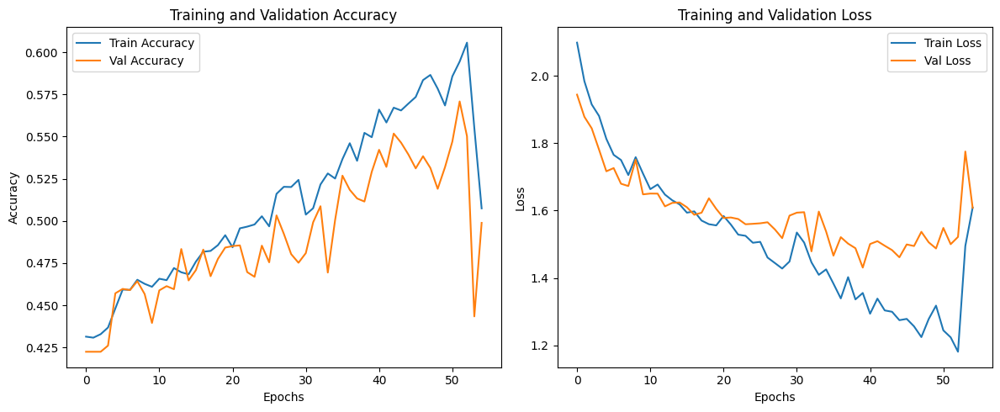

FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = '/content/drive/MyDrive/CNNLSTMtrained_model1.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [ ]:


history_path = '/content/drive/MyDrive/history.json'

# Custom Callback to update the same history file after each epoch
class SaveHistoryToFile(Callback):
    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}

        # Check if history file exists
        if os.path.exists(history_path):
            # If the file exists, load the existing history
            with open(history_path, 'r') as f:
                history_data = json.load(f)
        else:
            # If the file does not exist, initialize an empty history dictionary
            history_data = {'accuracy': [], 'val_accuracy': [], 'loss': [], 'val_loss': []}

        # Append the metrics from the current epoch to the history
        for key, value in logs.items():
            if key in history_data:
                history_data[key].append(value)
            else:
                history_data[key] = [value]

        # Save the updated history back to the file
        with open(history_path, 'w') as f:
            json.dump(history_data, f)



# Add the SaveHistoryToFile callback to your list of callbacks
save_history_callback = SaveHistoryToFile()



# Define the checkpoint callback to save and overwrite the model at each epoch
checkpoint_callback = ModelCheckpoint(
    filepath= '/content/drive/MyDrive/model_epoch.keras',  # Save the model
    save_weights_only=False,  # Save the entire model (including optimizer state)
    save_best_only=True,     # If you want to save only the best model, set this to True
    verbose=1
)



# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Set up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(
    X_traint, y_train,
    epochs=100,                # Set a high number, early stopping will stop before this
    batch_size=32,             # Using batch size of 32
    validation_data=(X_val, y_val),
    callbacks=[save_history_callback,checkpoint_callback,early_stopping],
    verbose=1                  # Optional: Set to 1 for detailed output
)

# Visualize training history
def plot_training_history(history):
    # Plot the training and validation accuracy
    plt.figure(figsize=(12, 5))

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Display the plot
    plt.tight_layout()
    plt.show()

# Call the plot function to visualize
plot_training_history(history)



Epoch 1/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.4139 - loss: 2.4672Epoch 1 - Average Weights: {'conv2d': -0.004640371538698673, 'conv2d_1': -0.0009429306956008077, 'conv2d_2': 0.0013893820578232408, 'time_distributed_1': 0.00017088555614463985, 'lstm': 0.08231102675199509, 'time_distributed_2': 0.00419932184740901, 'time_distributed_3': 0.006148090120404959, 'time_distributed_4': 0.00890682078897953, 'time_distributed_5': -0.03981199115514755}

Epoch 1: val_loss improved from inf to 2.06624, saving model to /content/drive/MyDrive/model_epoch.keras
60/60 ━━━━━━━━━━━━━━━━━━━━ 250s 4s/step - accuracy: 0.4140 - loss: 2.4652 - val_accuracy: 0.4222 - val_loss: 2.0662
Epoch 2/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.4361 - loss: 2.1174Epoch 2 - Average Weights: {'conv2d': -0.004617185797542334, 'conv2d_1': -0.0011494933860376477, 'conv2d_2': 0.0010902825742959976, 'time_distributed_1': 5.048292223364115e-05, 'lstm': 0.08229470998048782, 'time_distributed_2': 0.0

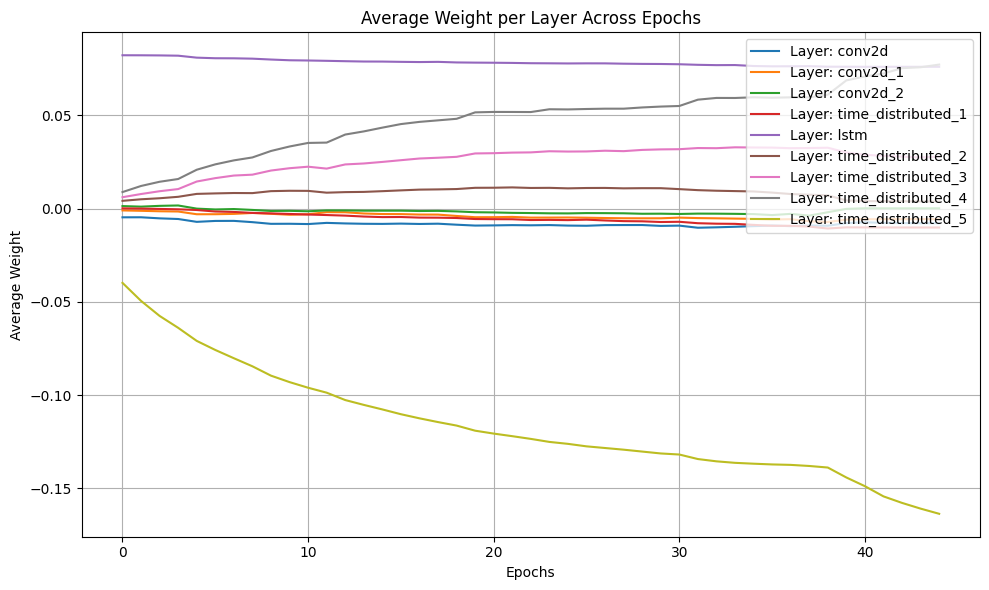

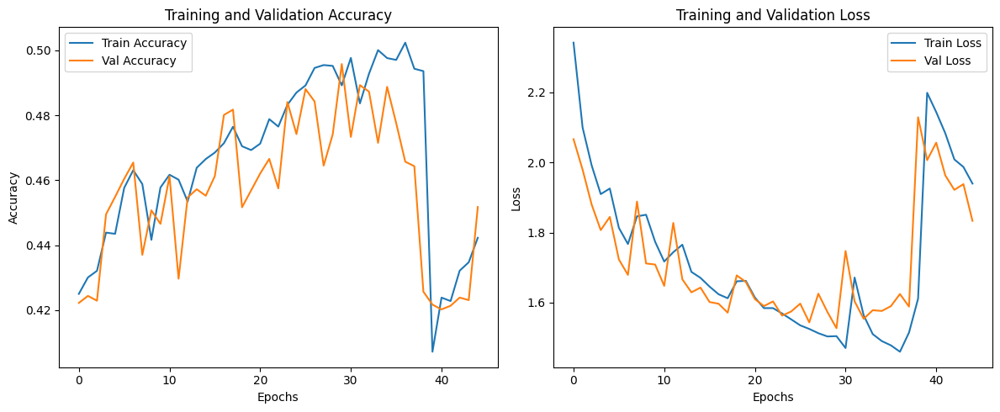

In [ ]:
import os
import json
import numpy as np
from tensorflow.keras.callbacks import Callback, ModelCheckpoint, EarlyStopping
import matplotlib.pyplot as plt
history_path = '/content/drive/MyDrive/history.json'

# Custom Callback to update the same history file after each epoch
class SaveHistoryToFile(Callback):
    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}

        # Check if history file exists
        if os.path.exists(history_path):
            # If the file exists, load the existing history
            with open(history_path, 'r') as f:
                history_data = json.load(f)
        else:
            # If the file does not exist, initialize an empty history dictionary
            history_data = {'accuracy': [], 'val_accuracy': [], 'loss': [], 'val_loss': []}

        # Append the metrics from the current epoch to the history
        for key, value in logs.items():
            if key in history_data:
                history_data[key].append(value)
            else:
                history_data[key] = [value]

        # Save the updated history back to the file
        with open(history_path, 'w') as f:
            json.dump(history_data, f)



# Add the SaveHistoryToFile callback to your list of callbacks
save_history_callback = SaveHistoryToFile()
# Custom Callback to save average weights and plot them after training
# Custom Callback to save average weights and plot them after training
class SaveAverageWeightsToFile(Callback):
    def __init__(self, avg_weights_path):
        super(SaveAverageWeightsToFile, self).__init__()
        self.avg_weights_path = avg_weights_path
        self.avg_weights_per_epoch = {}  # To store avg weights for each layer across epochs

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}

        # Dictionary to hold average weights for this epoch
        avg_weights_data = {}

        for layer in self.model.layers:
            layer_weights = layer.get_weights()

            if layer_weights:  # Only process layers that have weights
                avg_weights = [np.mean(w) for w in layer_weights]  # Compute average of each weight matrix
                avg_weight_for_layer = np.mean(avg_weights)  # Take the overall average across all weight matrices
                avg_weights_data[layer.name] = float(avg_weight_for_layer)  # Convert to Python float

                # Append to the tracking dictionary
                if layer.name not in self.avg_weights_per_epoch:
                    self.avg_weights_per_epoch[layer.name] = []
                self.avg_weights_per_epoch[layer.name].append(avg_weight_for_layer)

        # Convert all weights to Python float before saving to JSON
        avg_weights_data = {k: float(v) for k, v in avg_weights_data.items()}

        # Save the average weights for this epoch to a JSON file
        avg_weights_epoch_path = os.path.join(self.avg_weights_path, f'avg_weights_epoch_{epoch+1}.json')
        with open(avg_weights_epoch_path, 'w') as f:
            json.dump(avg_weights_data, f)

        # Optionally, print the average weights for this epoch
        print(f"Epoch {epoch+1} - Average Weights: {avg_weights_data}")

    def on_train_end(self, logs=None):
        # Plot the average weights per layer across epochs
        self.plot_avg_weights_per_epoch()

    def plot_avg_weights_per_epoch(self):
        plt.figure(figsize=(10, 6))

        for layer_name, avg_weights in self.avg_weights_per_epoch.items():
            plt.plot(avg_weights, label=f'Layer: {layer_name}')

        plt.title('Average Weight per Layer Across Epochs')
        plt.xlabel('Epochs')
        plt.ylabel('Average Weight')
        plt.legend(loc='upper right')
        plt.grid(True)
        plt.tight_layout()
        plt.show()

# Path to save the average weights
avg_weights_path = '/content/drive/MyDrive/avg_weights'

# Create the directory for weights if it doesn't exist
os.makedirs(avg_weights_path, exist_ok=True)

# Create the custom callback to save average weights
save_avg_weights_callback = SaveAverageWeightsToFile(avg_weights_path)

# Model checkpoint to save the best model
checkpoint_callback = ModelCheckpoint(
    filepath='/content/drive/MyDrive/model_epoch.keras',
    save_weights_only=False,
    save_best_only=True,
    verbose=1
)

# Set up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model with custom callbacks
history = model.fit(
    X_traint, y_train,
    epochs=100,
    batch_size=32,
    validation_data=(X_val, y_val),
    callbacks=[save_history_callback,save_avg_weights_callback, checkpoint_callback, early_stopping],
    verbose=1
)

# Visualize training history
def plot_training_history(history):
    plt.figure(figsize=(12, 5))

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Call the plot function to visualize training history
plot_training_history(history)


In [41]:
y_labels=np.load("/content/drive/MyDrive/yt.npy")

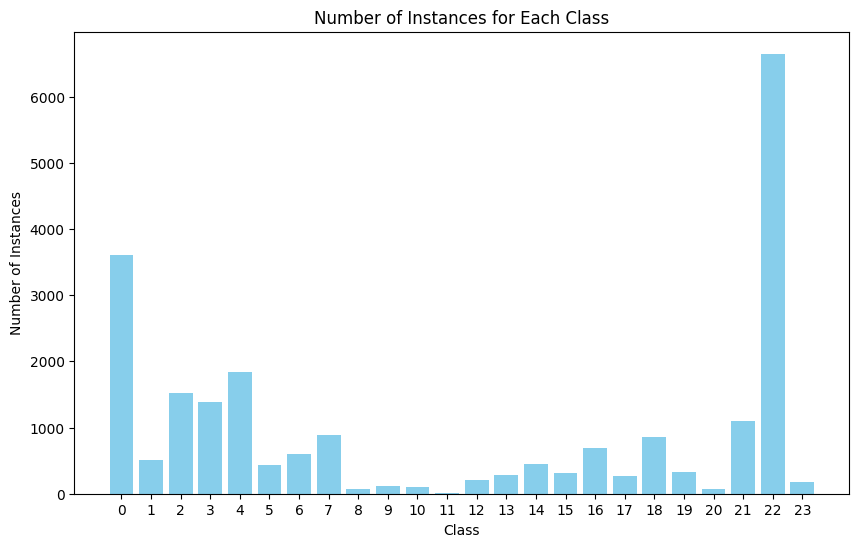

In [42]:
class_counts = np.sum(y_labels, axis=(0, 1))

# Plotting the counts of each class
classes = np.arange(24)
plt.figure(figsize=(10, 6))
plt.bar(classes, class_counts, color='skyblue')
plt.xlabel('Class')
plt.ylabel('Number of Instances')
plt.title('Number of Instances for Each Class')
plt.xticks(classes)
plt.show()

(24,)


In [ ]:
import random
instances=[]
remove=[]
for i in range(2401):
  l=0
  for j in range(24):
    if y_labels[i][j][22]==1:
      l=l+1
  instances.append(l)

for i in range((len(instances))):
  if instances[i]>=15:
    remove.append(i)

randomely_selected=random.sample(remove, int(0.75*int(len(remove))))
y_downsampled=np.delete(y_labels,randomely_selected,axis=0)




2196

In [ ]:

classes_per_video=np.zeros([len(y_downsampled),24])
for i in range(len(y_downsampled)):
  for j in range(24):
    for k in range(24):
     l=0

     if y_downsampled[i][j][k]==1:
        l=l+1

        classes_per_video[i][k]=classes_per_video[i][k]+l



In [ ]:
array=classes_per_video

In [ ]:
binary_array = (array > 0).astype(int)

# For each class, find the videos that contain only that class,
# excluding any video that belongs to class 0 or class 22.
class_videos = {}

for class_idx in range(24):
    if class_idx == 0 or class_idx == 22:
        continue  # Skip processing for classes 0 and 22

    # Find videos that have this class but do not belong to class 0 or 22
    videos_with_class = np.where((binary_array[:, class_idx] == 1) &
                                 (binary_array[:, 0] == 0) &
                                 (binary_array[:, 22] == 0) &
                                 (np.sum(binary_array[:, :24], axis=1) == 1))[0]  # Ensure only one class is present

    # Store the result in a dictionary if there are any matching videos
    if len(videos_with_class) > 0:
        class_videos[class_idx] = videos_with_class.tolist()

# Display the result in the form: "The class X has videos: [1, 2, 3]"
for class_idx, videos in class_videos.items():
    print(f"The class {class_idx} has videos: {videos}")

The class 1 has videos: [75, 76, 86, 87, 97, 107, 108, 155, 163, 164, 186, 198, 199, 213, 214, 231, 261, 285, 356, 365, 377, 535, 551, 552, 553, 579, 580, 720, 721, 731, 739, 744, 745, 765, 791, 806]
The class 2 has videos: [10, 11, 18, 19, 20, 21, 843, 844, 845, 846, 847, 852, 853, 924, 925, 926, 927, 928, 929, 930, 931, 1004, 1119, 1120, 1124, 1225, 1226, 1227, 1237, 1238, 1291, 1299, 1300, 1354, 1355, 1356, 1357, 1358, 1359, 1360, 1388, 1389, 1390, 1391, 1392, 1393, 1394, 1395, 1396, 1397, 1398, 1403, 1404, 1405, 1406, 1459, 1460, 1461, 1462, 1463, 1469, 1470, 1520, 1521, 1532, 1619, 1620, 1621, 1622, 1623, 1624, 1628, 1629, 1630, 1631, 1632, 1633]
The class 3 has videos: [45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 886, 887, 888, 889, 897, 898, 899, 900, 901, 902, 955, 956, 957, 958, 959, 960, 961, 962, 963, 1024, 1025, 1026, 1027, 1028, 1029, 1030, 1031, 1032, 1033, 1034, 1035, 1036, 1037, 1038, 1086, 1087, 1088, 1089, 1090, 1091, 1092, 1093, 1094, 1139, 1140, 1141, 1142, 1143, 11

In [ ]:
# Find videos that belong to class 8, 10, or 11, but not to class 0 or 22, and also check if they belong to other classes.
target_classes = [8, 10, 11]
class_videos = {}

# Process all classes from 1 to 23 except class 0 and 22
for class_idx in range(1, 24):
    if class_idx == 22:
        continue  # Skip class 22

    # Find videos that belong to the current class but do not belong to class 0 or 22
    videos_with_class = np.where((binary_array[:, class_idx] == 1) &
                                 (binary_array[:, 0] == 0) &
                                 (binary_array[:, 22] == 0))[0]

    # Store the result in a dictionary if there are any matching videos
    if len(videos_with_class) > 0:
        class_videos[class_idx] = videos_with_class.tolist()

# Step 3: Map videos to the classes they belong to
video_classes_map = {}

# Create a map of videos to the classes they belong to
for class_idx, videos in class_videos.items():
    for video in videos:
        if video not in video_classes_map:
            video_classes_map[video] = []
        video_classes_map[video].append(class_idx)

# Print the videos that belong to classes 8, 10, or 11, including those that belong to multiple classes.
for video, classes in video_classes_map.items():
    # Check if video belongs to one of the target classes (8, 10, or 11)
    if any(cls in target_classes for cls in classes):
        if len(classes) == 1:
            # If the video belongs to only one class, print it
            print(f"Video {video} belongs to class {classes[0]}")
        else:
            # If the video belongs to multiple classes, print the video and all classes it belongs to
            print(f"Video {video} belongs to multiple classes: {classes}")



Video 1353 belongs to multiple classes: [2, 10]
Video 891 belongs to multiple classes: [8, 13]
Video 892 belongs to multiple classes: [8, 17]
Video 841 belongs to multiple classes: [10, 15, 18]
Video 1352 belongs to multiple classes: [10, 15]
Video 1289 belongs to multiple classes: [11, 18]


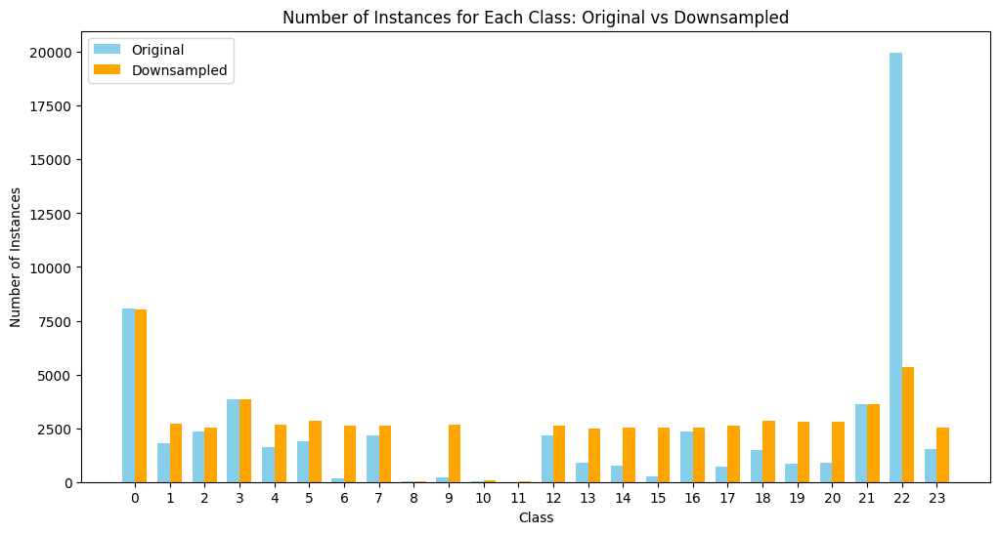

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming y_labels is your original array and y_downsampled is your downsampled array
# Calculate class counts for both y_labels and y_downsampled
class_counts_original = np.sum(y_labels, axis=(0, 1))
class_counts_downsampled = np.sum(y_downsampled, axis=(0, 1))
class_counts_downsampled_or=class_counts_downsampled
oversampl=[]
for i in range(len(class_counts_downsampled)):
  multy=2
  if (i==0)or(i==22):
    multy=0
    oversampl.append(0)
    continue
  if i==8:
     class_counts_downsampled[i]=18+(class_counts_downsampled_or[i])
     multy=18
     oversampl.append(multy)
     continue
  if i==10:
     class_counts_downsampled[i]=32+class_counts_downsampled_or[i]
     multy=32
     oversampl.append(multy)
     continue
  if i==11:
     class_counts_downsampled[i]=6+class_counts_downsampled_or[i]
     multy=6
     oversampl.append(multy)
     continue
  if (i!=0)or(i!=22):
   if (i!=8)and(i!=10)and(i!=11):
    initial=class_counts_downsampled[i]
    while(class_counts_downsampled[i]<2500):
     class_counts_downsampled[i]=multy*len(class_videos[i])+(class_counts_downsampled_or[i])
     multy=multy+1


  oversampl.append(multy)

# Define the class labels
classes = np.arange(24)

# Plotting the counts of each class for both y_labels and y_downsampled
plt.figure(figsize=(12, 6))
bar_width = 0.35  # Width of the bars

# Positions of the bars on the x-axis
r1 = np.arange(len(classes))
r2 = [x + bar_width for x in r1]

# Create bars for original data
plt.bar(r1, class_counts_original, color='skyblue', width=bar_width, label='Original')

# Create bars for downsampled data
plt.bar(r2, class_counts_downsampled, color='orange', width=bar_width, label='Downsampled')

# Adding labels and title
plt.xlabel('Class')
plt.ylabel('Number of Instances')
plt.title('Number of Instances for Each Class: Original vs Downsampled')
plt.xticks([r + bar_width / 2 for r in range(len(classes))], classes)

# Add legend
plt.legend()

# Show the plot
plt.show()


In [ ]:
class_counts_downsampled_or[11]

6109.0

In [ ]:
print(oversampl)

[0, 6, 3, 2, 6, 6, 27, 4, 18, 27, 32, 6, 4, 9, 11, 20, 3, 11, 7, 11, 11, 2, 0, 7]


In [ ]:
repeat=np.zeros(1785)

In [ ]:
for i in range(24):
    value = class_videos.get(i)  # Get the value for the key, returns None if the key doesn't exist
    if value is not None:    # Check if the value exists
        for j in value:
          repeat[j]=oversampl[i]

In [ ]:

Xtrain=np.load("/content/drive/MyDrive/X_train.npy")

In [ ]:
X_downsampled=np.delete(Xtrain,randomely_selected,axis=0)

In [ ]:
np.save("/content/drive/MyDrive/X_downsampled2.npy",X_downsampled)
np.save("/content/drive/MyDrive/y_downsampled2.npy",y_downsampled)
np.save("/content/drive/MyDrive/repeat2.npy",repeat)
np.save("/content/drive/MyDrive/oversampl2.npy",oversampl)

In [ ]:
type(y_downsampled)

numpy.ndarray

In [ ]:
print(y_downsampled.shape)

(1785, 24, 24)


In [ ]:
repeat = repeat.astype(np.int64)

In [ ]:


# Repeat the array along the N dimension
y_new = np.repeat(y_downsampled, repeat, axis=0)

In [ ]:
X_new=np.repeat(X_downsampled, repeat, axis=0)

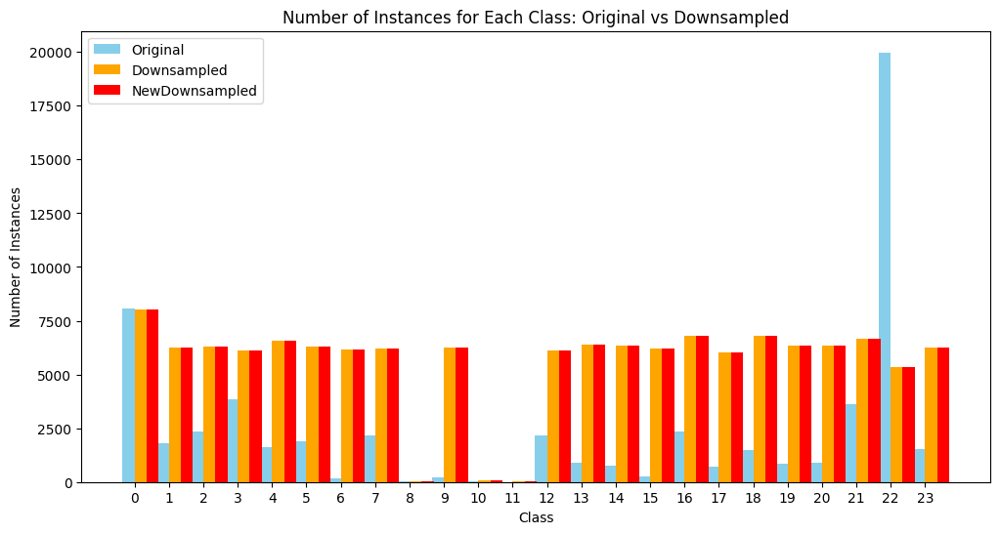

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming y_labels is your original array and y_downsampled is your downsampled array
# Calculate class counts for both y_labels and y_downsampled
class_counts_original = np.sum(y_labels, axis=(0, 1))
class_counts_new=np.sum(y_new, axis=(0, 1))
class_counts_downsampled = np.sum(y_downsampled, axis=(0, 1))
class_counts_downsampled_or=class_counts_downsampled
oversampl=[]
for i in range(len(class_counts_downsampled)):
  multy=2
  if (i==0)or(i==22):
    multy=0
    oversampl.append(0)
    continue
  if i==8:
     class_counts_downsampled[i]=18+(class_counts_downsampled_or[i])
     multy=18
     oversampl.append(multy)
     continue
  if i==10:
     class_counts_downsampled[i]=32+class_counts_downsampled_or[i]
     multy=32
     oversampl.append(multy)
     continue
  if i==11:
     class_counts_downsampled[i]=6+class_counts_downsampled_or[i]
     multy=6
     oversampl.append(multy)
     continue
  if (i!=0)or(i!=22):
   if (i!=8)and(i!=10)and(i!=11):
    initial=class_counts_downsampled[i]
    while(class_counts_downsampled[i]<6000):
     class_counts_downsampled[i]=multy*len(class_videos[i])+(class_counts_downsampled_or[i])
     multy=multy+1


  oversampl.append(multy)

# Define the class labels
classes = np.arange(24)

# Plotting the counts of each class for both y_labels and y_downsampled
plt.figure(figsize=(12, 6))
bar_width = 0.35  # Width of the bars

# Positions of the bars on the x-axis
r1 = np.arange(len(classes))
r2 = [x + bar_width for x in r1]
r3 = [x + bar_width for x in r2]
# Create bars for original data
plt.bar(r1, class_counts_original, color='skyblue', width=bar_width, label='Original')

# Create bars for downsampled data
plt.bar(r2, class_counts_downsampled, color='orange', width=bar_width, label='Downsampled')
plt.bar(r3, class_counts_downsampled, color='red', width=bar_width, label='NewDownsampled')
# Adding labels and title
plt.xlabel('Class')
plt.ylabel('Number of Instances')
plt.title('Number of Instances for Each Class: Original vs Downsampled')
plt.xticks([r + bar_width / 2 for r in range(len(classes))], classes)

# Add legend
plt.legend()

# Show the plot
plt.show()


In [ ]:
np.save("/content/drive/MyDrive/X_new2.npy",X_new)
np.save("/content/drive/MyDrive/y_new2.npy",y_new)

In [ ]:
array=X_new
# Extract the last dimension slices separately
slice_0 = array[..., 0]  # First channel NxXxGx0
slice_1 = array[..., 1]  # Second channel NxXxGx1

# Perform min-max scaling on slice_0
min_val_0 = np.min(slice_0)  # Min of NxXxGx0
max_val_0 = np.max(slice_0)  # Max of NxXxGx0
scaled_slice_0 = (slice_0 - min_val_0) / (max_val_0 - min_val_0)

# Perform min-max scaling on slice_1
min_val_1 = np.min(slice_1)  # Min of NxXxGx1
max_val_1 = np.max(slice_1)  # Max of NxXxGx1
scaled_slice_1 = (slice_1 - min_val_1) / (max_val_1 - min_val_1)

# Combine both scaled slices back into the original shape
X_scaled_array = np.stack((scaled_slice_0, scaled_slice_1), axis=-1)



print("\nScaled Array (Separate scaling for the last dimension):")
print(X_scaled_array.shape)





Scaled Array (Separate scaling for the last dimension):
(5896, 24, 45, 2)


In [ ]:
# Split the data into training (80%) and validation (20%) sets
X_traint, X_val, y_train, y_val = train_test_split(X_scaled_array, y_new, test_size=0.2, random_state=42)
np.save("/content/drive/MyDrive/X_traint3.npy", X_traint)
np.save("/content/drive/MyDrive/X_val3.npy", X_val)
np.save("/content/drive/MyDrive/y_traint3.npy", y_train)
np.save("/content/drive/MyDrive/y_val3.npy", y_val)

In [ ]:
from tensorflow.keras import layers, models, regularizers
# Define input dimensions and number of classes
Nattr = 2 # Number of attributes per joint
Njoint = 45  # Number of joints
Nfr = 24  # Number of frames (time steps)
classes = 24  # Number of output classes

# Input shape
input_shape = (Nfr, Njoint, Nattr)
def create_model_updated():
    input_layer = layers.Input(shape=input_shape)

    # First Conv2D layer - Increase filter size and number of filters
    x = layers.Conv2D(128, (5, 5), activation='relu', kernel_initializer='he_normal', padding='same')(input_layer)
    x = layers.MaxPooling2D((1, 2), strides=(1, 2), padding='same')(x)
    x = layers.BatchNormalization()(x)

    # Second Conv2D layer - Larger filters and more filters, add BatchNorm
    x = layers.Conv2D(256, (5, 5), activation='relu', kernel_initializer='he_normal', padding='same')(x)
    x = layers.MaxPooling2D((1, 2), strides=(1, 2), padding='same')(x)
    x = layers.BatchNormalization()(x)

    # TimeDistributed + Flatten
    x = layers.TimeDistributed(layers.Flatten())(x)

    # TimeDistributed Dense layers (flatten per timestep) - Reduce dropout and add BatchNorm
    x = layers.TimeDistributed(layers.Dense(256, activation='relu', kernel_initializer='he_normal'))(x)
    x = layers.BatchNormalization()(x)

    # LSTM with recurrent dropout increased
    x = layers.LSTM(256, activation='tanh', return_sequences=True, recurrent_dropout=0.3)(x)

    # TimeDistributed Dense layers (post-LSTM) - Reduced regularization
    x = layers.TimeDistributed(layers.Dense(256, activation='relu'))(x)
    x = layers.Dropout(0.2)(x)

    # TimeDistributed Dense layer with reduced dropout in final layer
    x = layers.TimeDistributed(layers.Dense(64, activation='relu'))(x)
    x = layers.Dropout(0.3)(x)

    # Final output layer
    output = layers.TimeDistributed(layers.Dense(classes, activation='softmax'))(x)

    model = models.Model(inputs=input_layer, outputs=output)

    # Compile model with gradient clipping
    optimizer = tf.keras.optimizers.Adam(clipnorm=1.0)
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Create and compile the model
model = create_model_updated()

# Model summary
model.summary()


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 24, 45, 2)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 24, 45, 128)         │           6,528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 24, 23, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 24, 23, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 24, 23, 256)         │         819,456 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 24, 12, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 24, 12, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_15                  │ (None, 24, 3072)            │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_16                  │ (None, 24, 256)             │         786,688 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_11               │ (None, 24, 256)             │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 24, 256)             │         525,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_17                  │ (None, 24, 256)             │          65,792 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 24, 256)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_18                  │ (None, 24, 64)              │          16,448 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 24, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_19                  │ (None, 24, 24)              │           1,560 │
│ (TimeDistributed)                    │                             │                 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,224,344 (8.49 MB)

 Trainable params: 2,223,064 (8.48 MB)

 Non-trainable params: 1,280 (5.00 KB)

Epoch 1/100
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.2301 - loss: 2.4790Epoch 1 - Average Weights: {'conv2d_6': -0.005128421820700169, 'batch_normalization_9': 0.40890437364578247, 'conv2d_7': -0.001277270377613604, 'batch_normalization_10': 0.8782098293304443, 'time_distributed_16': -0.00031569728162139654, 'batch_normalization_11': 1.0645644664764404, 'lstm_3': 0.08539306372404099, 'time_distributed_17': 0.002183634089305997, 'time_distributed_18': 0.002897457219660282, 'time_distributed_19': -0.01333251129835844}

Epoch 1: val_loss improved from inf to 7.02118, saving model to /content/drive/MyDrive/model3_epoch.keras
74/74 ━━━━━━━━━━━━━━━━━━━━ 415s 5s/step - accuracy: 0.2309 - loss: 2.4751 - val_accuracy: 0.0203 - val_loss: 7.0212
Epoch 2/100
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.4578 - loss: 1.6166Epoch 2 - Average Weights: {'conv2d_6': -0.007590258494019508, 'batch_normalization_9': 0.3636188507080078, 'conv2d_7': -0.0037684019189327955, 'batch_normalizat

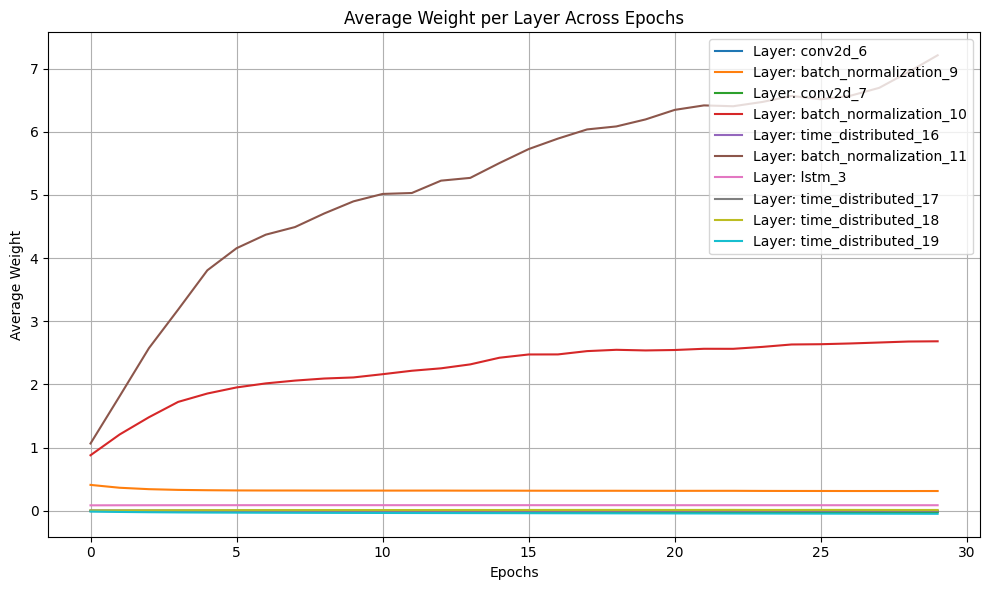

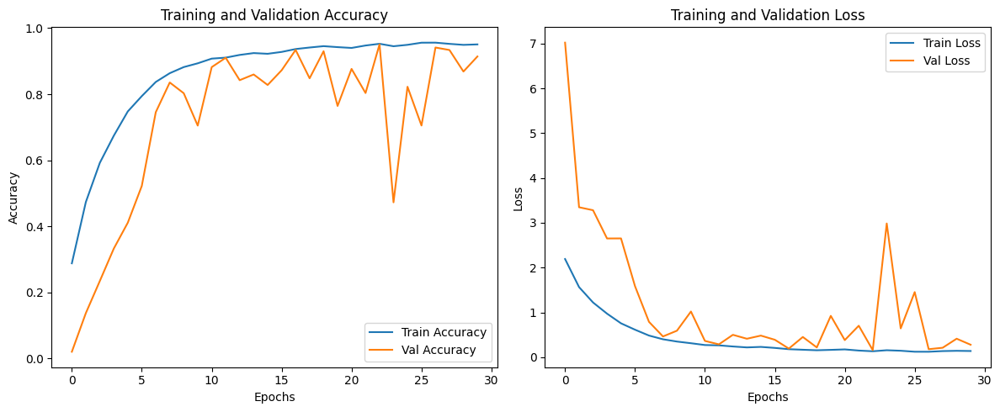

In [ ]:
import os
import json
import numpy as np
from tensorflow.keras.callbacks import Callback, ModelCheckpoint, EarlyStopping
import matplotlib.pyplot as plt
history_path = '/content/drive/MyDrive/history3.json'

# Custom Callback to update the same history file after each epoch
class SaveHistoryToFile(Callback):
    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}

        # Check if history file exists
        if os.path.exists(history_path):
            # If the file exists, load the existing history
            with open(history_path, 'r') as f:
                history_data = json.load(f)
        else:
            # If the file does not exist, initialize an empty history dictionary
            history_data = {'accuracy': [], 'val_accuracy': [], 'loss': [], 'val_loss': []}

        # Append the metrics from the current epoch to the history
        for key, value in logs.items():
            if key in history_data:
                history_data[key].append(value)
            else:
                history_data[key] = [value]

        # Save the updated history back to the file
        with open(history_path, 'w') as f:
            json.dump(history_data, f)



# Add the SaveHistoryToFile callback to your list of callbacks
save_history_callback = SaveHistoryToFile()
# Custom Callback to save average weights and plot them after training
# Custom Callback to save average weights and plot them after training
class SaveAverageWeightsToFile(Callback):
    def __init__(self, avg_weights_path):
        super(SaveAverageWeightsToFile, self).__init__()
        self.avg_weights_path = avg_weights_path
        self.avg_weights_per_epoch = {}  # To store avg weights for each layer across epochs

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}

        # Dictionary to hold average weights for this epoch
        avg_weights_data = {}

        for layer in self.model.layers:
            layer_weights = layer.get_weights()

            if layer_weights:  # Only process layers that have weights
                avg_weights = [np.mean(w) for w in layer_weights]  # Compute average of each weight matrix
                avg_weight_for_layer = np.mean(avg_weights)  # Take the overall average across all weight matrices
                avg_weights_data[layer.name] = float(avg_weight_for_layer)  # Convert to Python float

                # Append to the tracking dictionary
                if layer.name not in self.avg_weights_per_epoch:
                    self.avg_weights_per_epoch[layer.name] = []
                self.avg_weights_per_epoch[layer.name].append(avg_weight_for_layer)

        # Convert all weights to Python float before saving to JSON
        avg_weights_data = {k: float(v) for k, v in avg_weights_data.items()}

        # Save the average weights for this epoch to a JSON file
        avg_weights_epoch_path = os.path.join(self.avg_weights_path, f'avg_weights_epoch_{epoch+1}.json')
        with open(avg_weights_epoch_path, 'w') as f:
            json.dump(avg_weights_data, f)

        # Optionally, print the average weights for this epoch
        print(f"Epoch {epoch+1} - Average Weights: {avg_weights_data}")

    def on_train_end(self, logs=None):
        # Plot the average weights per layer across epochs
        self.plot_avg_weights_per_epoch()

    def plot_avg_weights_per_epoch(self):
        plt.figure(figsize=(10, 6))

        for layer_name, avg_weights in self.avg_weights_per_epoch.items():
            plt.plot(avg_weights, label=f'Layer: {layer_name}')

        plt.title('Average Weight per Layer Across Epochs')
        plt.xlabel('Epochs')
        plt.ylabel('Average Weight')
        plt.legend(loc='upper right')
        plt.grid(True)
        plt.tight_layout()
        plt.show()

# Path to save the average weights
avg_weights_path = '/content/drive/MyDrive/avg_weights3'

# Create the directory for weights if it doesn't exist
os.makedirs(avg_weights_path, exist_ok=True)

# Create the custom callback to save average weights
save_avg_weights_callback = SaveAverageWeightsToFile(avg_weights_path)

# Model checkpoint to save the best model
checkpoint_callback = ModelCheckpoint(
    filepath='/content/drive/MyDrive/model3_epoch.keras',
    save_weights_only=False,
    save_best_only=True,
    verbose=1
)

# Set up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True)

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model with custom callbacks
history = model.fit(
    X_traint, y_train,
    epochs=100,
    batch_size=64,
    validation_data=(X_val, y_val),
    callbacks=[save_history_callback,save_avg_weights_callback, checkpoint_callback, early_stopping],
    verbose=1
)

# Visualize training history
def plot_training_history(history):
    plt.figure(figsize=(12, 5))

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Call the plot function to visualize training history
plot_training_history(history)


In [61]:
X_test=np.load("/content/drive/MyDrive/X_test.npy")
y_test=np.load("/content/drive/MyDrive/yt.npy")

In [47]:
array=X_test
# Extract the last dimension slices separately
slice_0 = array[..., 0]  # First channel NxXxGx0
slice_1 = array[..., 1]  # Second channel NxXxGx1

# Perform min-max scaling on slice_0
min_val_0 = np.min(slice_0)  # Min of NxXxGx0
max_val_0 = np.max(slice_0)  # Max of NxXxGx0
scaled_slice_0 = (slice_0 - min_val_0) / (max_val_0 - min_val_0)

# Perform min-max scaling on slice_1
min_val_1 = np.min(slice_1)  # Min of NxXxGx1
max_val_1 = np.max(slice_1)  # Max of NxXxGx1
scaled_slice_1 = (slice_1 - min_val_1) / (max_val_1 - min_val_1)

# Combine both scaled slices back into the original shape
X_test = np.stack((scaled_slice_0, scaled_slice_1), axis=-1)

In [48]:
import tensorflow as tf
import numpy as np
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
import time  # For measuring prediction time

# Load the saved model
model = tf.keras.models.load_model('/content/drive/MyDrive/model3_epoch.keras')


# Start the timer
start_time = time.time()

# Make predictions
predictions = model.predict(X_test)

# End the timer
end_time = time.time()

# Calculate the total time taken for all predictions
total_time = end_time - start_time

# Convert predicted probabilities to class labels
predicted_classes = np.argmax(predictions, axis=1)

30/30 ━━━━━━━━━━━━━━━━━━━━ 22s 689ms/step


In [52]:
reshaped_array = predictions.reshape(937*24, 24)
predicted_classes = np.argmax(reshaped_array, axis=1)

In [62]:
zeros_array = np.zeros((1, 24, 24))
y_test = np.vstack((y_test, zeros_array))
y_test = y_test.reshape(937*24, 24)

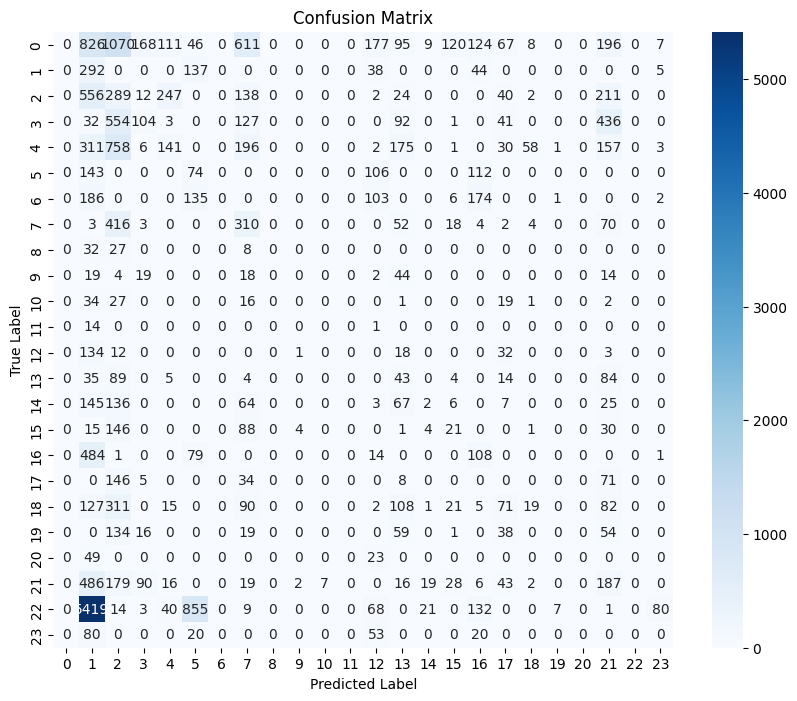

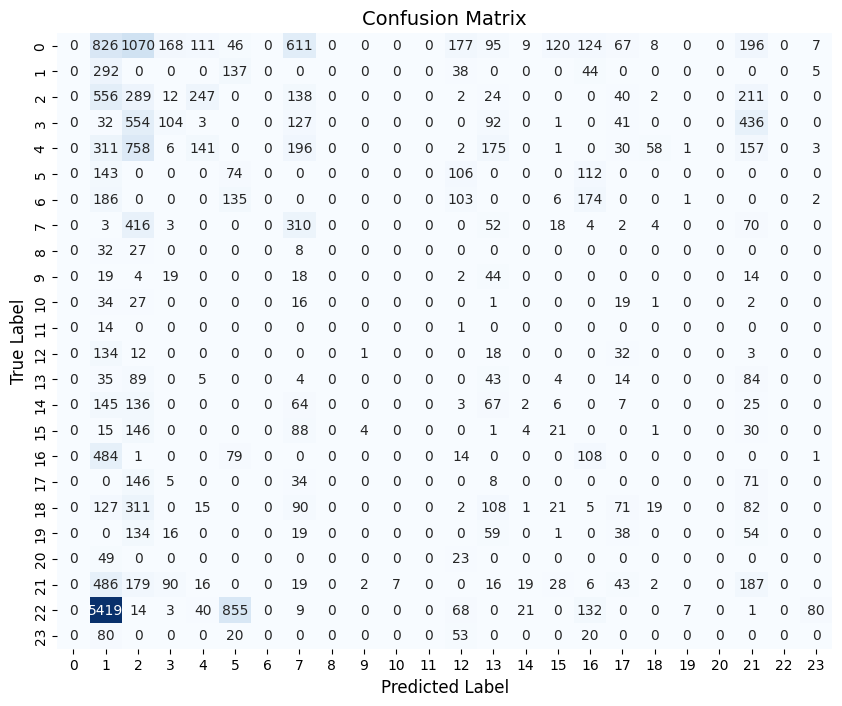

Precision (weighted): 0.0687
Recall (weighted): 0.0707
F1 Score (weighted): 0.0506

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00      3635
           1       0.03      0.57      0.06       516
           2       0.07      0.19      0.10      1521
           3       0.24      0.07      0.11      1390
           4       0.24      0.08      0.12      1839
           5       0.05      0.17      0.08       435
           6       0.00      0.00      0.00       607
           7       0.18      0.35      0.24       882
           8       0.00      0.00      0.00        67
           9       0.00      0.00      0.00       120
          10       0.00      0.00      0.00       100
          11       0.00      0.00      0.00        15
          12       0.00      0.00      0.00       200
          13       0.05      0.15      0.08       278
          14       0.04      0.00      0.01       455
          15       0.09    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/m

In [64]:
#y_test = np.argmax(y_test, axis=1)  # If y_test is one-hot encoded

# Confusion matrix
cm = confusion_matrix(y_test, predicted_classes)

# Plot confusion matrix using seaborn's heatmap for better visualization
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=True, yticklabels=True)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.title('Confusion Matrix', fontsize=14)
plt.show()


# Calculate and print Precision, Recall, F1 Score (weighted)
precision = precision_score(y_test, predicted_classes, average='weighted')
recall = recall_score(y_test, predicted_classes, average='weighted')
f1 = f1_score(y_test, predicted_classes, average='weighted')

print(f"Precision (weighted): {precision:.4f}")
print(f"Recall (weighted): {recall:.4f}")
print(f"F1 Score (weighted): {f1:.4f}")

# Optionally, you can print a detailed classification report
print("\nClassification Report:\n", classification_report(y_test, predicted_classes))

# Calculate and print the average time per instance
num_instances = len(X_test)
avg_time_per_instance = total_time / num_instances

print(f"Total prediction time for {num_instances} instances: {total_time:.4f} seconds")
print(f"Average time per instance: {avg_time_per_instance:.6f} seconds")

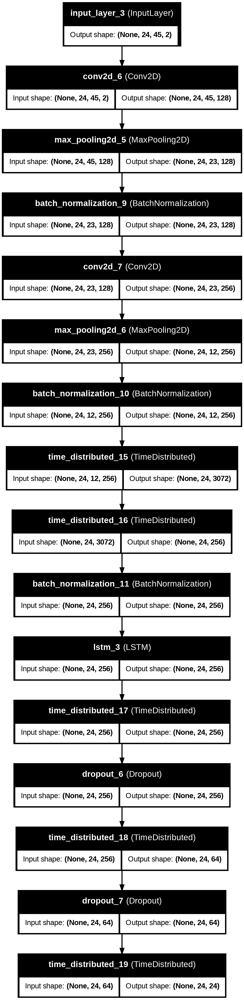

In [65]:
from tensorflow.keras.utils import plot_model
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)